### Kidney Stone Prediction using ML and DL with Model Deployment on web using Streamlit Cloud 

In [168]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [169]:
df = pd.read_csv('kidney_stone_data.csv')

In [170]:
df.head(10)

,id,gravity,ph,osmo,cond,urea,calc,target
0,0,1.013,6.19,443,14.8,124,1.45,0
1,1,1.025,5.40,703,23.6,394,4.18,0
2,2,1.009,6.13,371,24.5,159,9.04,0
3,3,1.021,4.91,442,20.8,398,6.63,1
4,4,1.021,5.53,874,17.8,385,2.21,1
5,5,1.025,6.90,947,28.4,395,2.64,1
6,6,1.008,5.09,371,15.5,159,2.17,1
7,7,1.015,5.53,450,8.1,170,1.16,0
8,8,1.025,7.38,736,25.3,418,1.52,0
9,9,1.017,6.61,527,20.0,75,4.49,1


In [171]:
df.shape

(414, 8)

In [172]:
df.columns

Index(['id', 'gravity', 'ph', 'osmo', 'cond', 'urea', 'calc', 'target'], dtype='object')

In [173]:
# checking for duplicates (row entries)
print('Duplicate values:', df.duplicated().sum())

# checking for null values
print('Null values:', df.isnull().sum())

Duplicate values: 0
Null values: id         0
gravity    0
ph         0
osmo       0
cond       0
urea       0
calc       0
target     0
dtype: int64


In [174]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 414 entries, 0 to 413
Data columns (total 8 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       414 non-null    int64  
 1   gravity  414 non-null    float64
 2   ph       414 non-null    float64
 3   osmo     414 non-null    int64  
 4   cond     414 non-null    float64
 5   urea     414 non-null    int64  
 6   calc     414 non-null    float64
 7   target   414 non-null    int64  
dtypes: float64(4), int64(4)
memory usage: 26.0 KB


In [175]:
df.describe()

,id,gravity,ph,osmo,cond,urea,calc,target
count,414.000000,414.000000,414.000000,414.000000,414.000000,414.000000,414.000000,414.000000
mean,206.500000,1.017894,5.955459,651.545894,21.437923,278.657005,4.114638,0.444444
std,119.655756,0.006675,0.642260,234.676567,7.514750,136.442249,3.217641,0.497505
min,0.000000,1.005000,4.760000,187.000000,5.100000,10.000000,0.170000,0.000000
25%,103.250000,1.012000,5.530000,455.250000,15.500000,170.000000,1.450000,0.000000
50%,206.500000,1.018000,5.740000,679.500000,22.200000,277.000000,3.130000,0.000000
75%,309.750000,1.022000,6.280000,840.000000,27.600000,385.000000,6.630000,1.000000
max,413.000000,1.040000,7.940000,1236.000000,38.000000,620.000000,14.340000,1.000000


In [176]:
# checking for no. of unique values present in each of the features
df.nunique()

id         414
gravity     28
ph          71
osmo        80
cond        65
urea        73
calc        85
target       2
dtype: int64

In [177]:
df = df.drop('id', axis=1)

In [178]:
df['target'].unique()

array([0, 1], dtype=int64)

In [179]:
df['target'].value_counts()

0    230
1    184
Name: target, dtype: int64

In [180]:
# the target data is in the form of 55:45 split
# so its near to an even split and we can continue with the entire data to explore it further

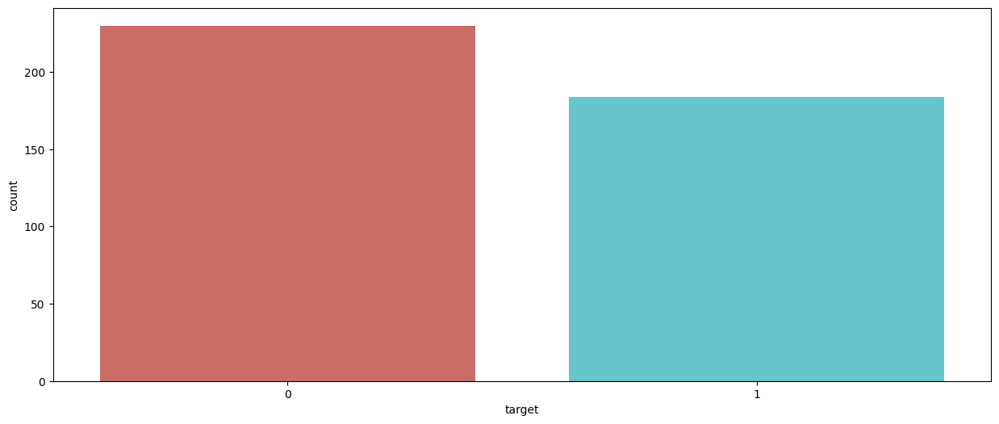

In [181]:
plt.figure(figsize=(15,6))
sns.countplot(x=df['target'], data=df, palette='hls')
plt.show()

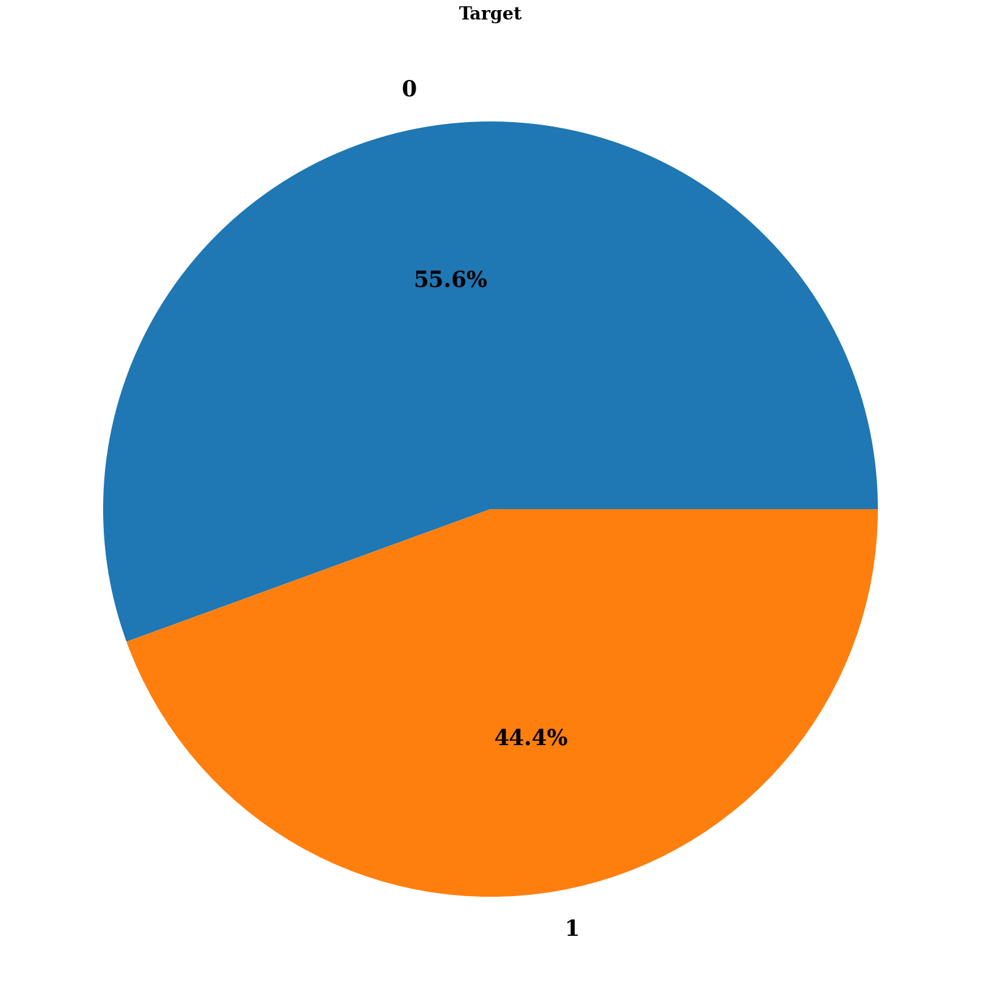

In [182]:
plt.figure(figsize=(20,20))
plt.pie(x= df['target'].value_counts(),
    labels= df['target'].value_counts().index,
    autopct= "%1.1f%%",   # we are trying to show the values nearing to one decimal place
    textprops={ 'fontsize': 25,
                'color': 'black',
                'weight': 'bold',
                'family': 'serif' }
    )
hfont = {'fontname':'serif', 'weight':'bold'}
plt.title('Target', size=20, **hfont)
plt.show()

In [183]:
import plotly.express as px
# plotly.express -- library providing highly interactive graphs

fig = px.bar(data_frame=df,
             x=df['target'],
             y= df.index)
fig.show()

In [184]:
value_counts = df['target'].value_counts()
fig = px.pie(names=df['target'].value_counts().index, values = value_counts)
fig.update_layout(title_x = 0.5)   # setting the title position at the centre
fig.show()

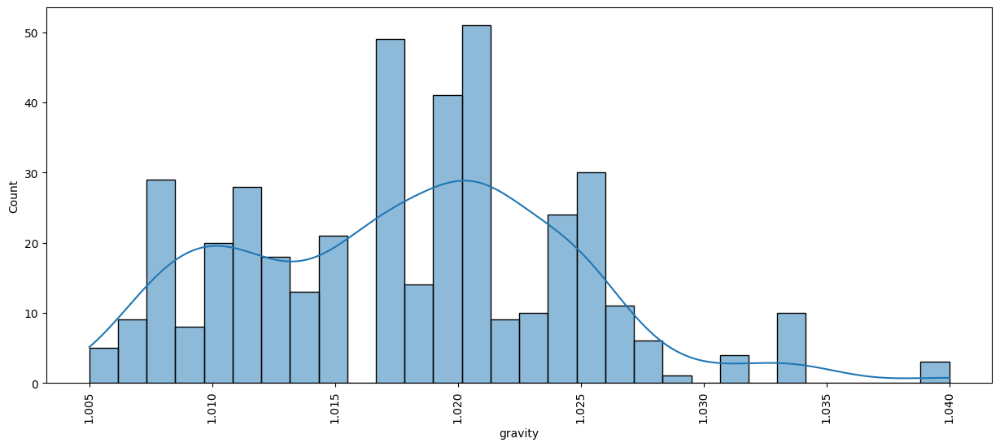

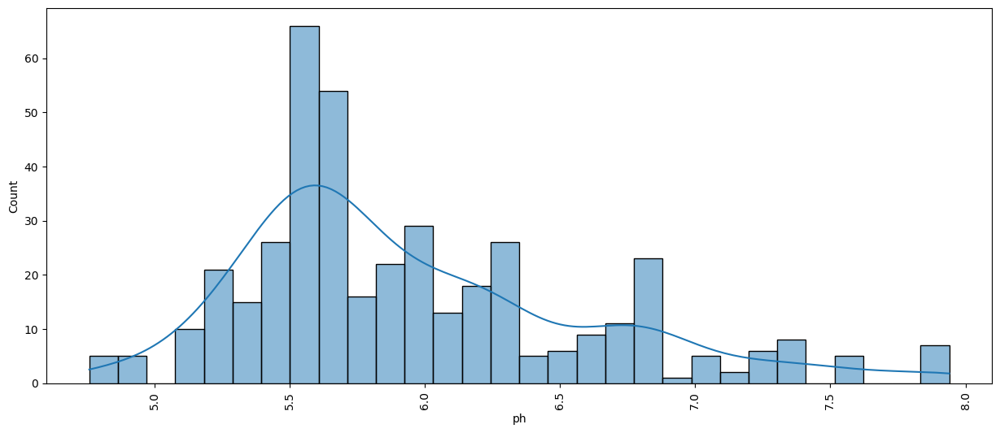

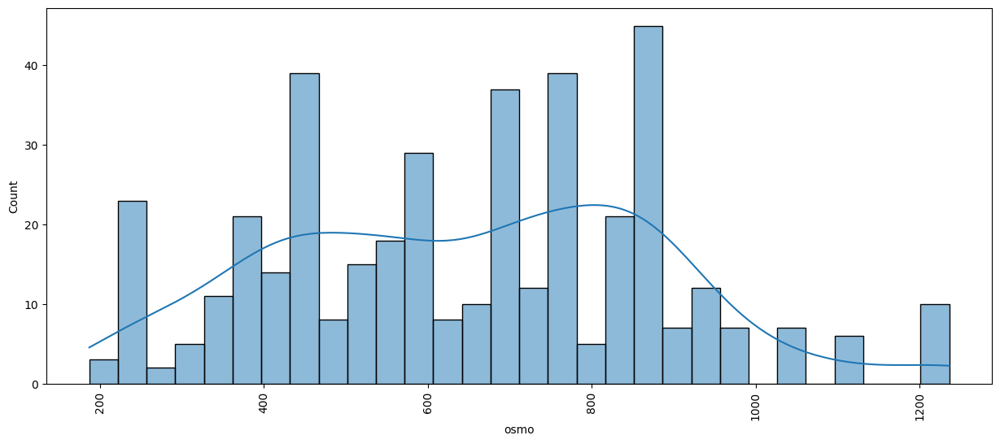

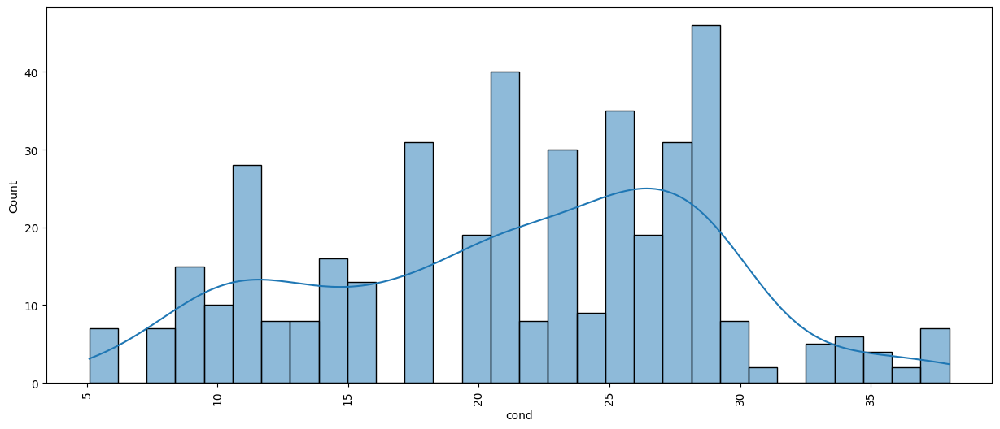

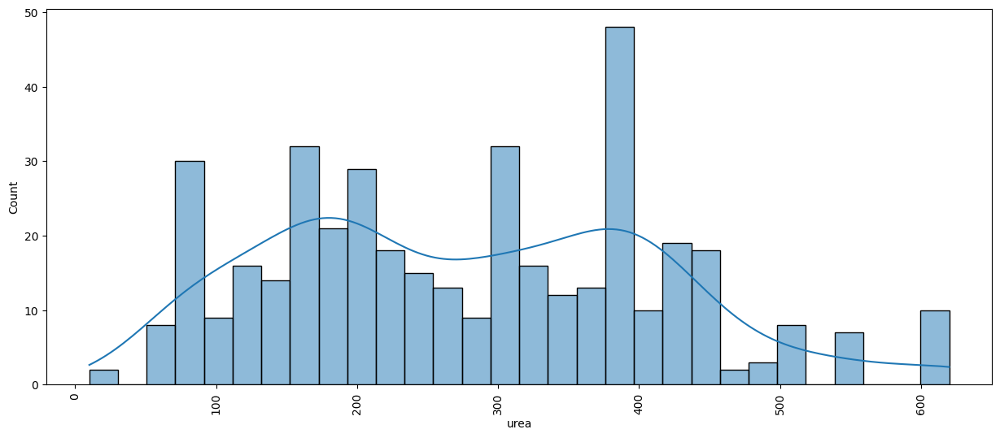

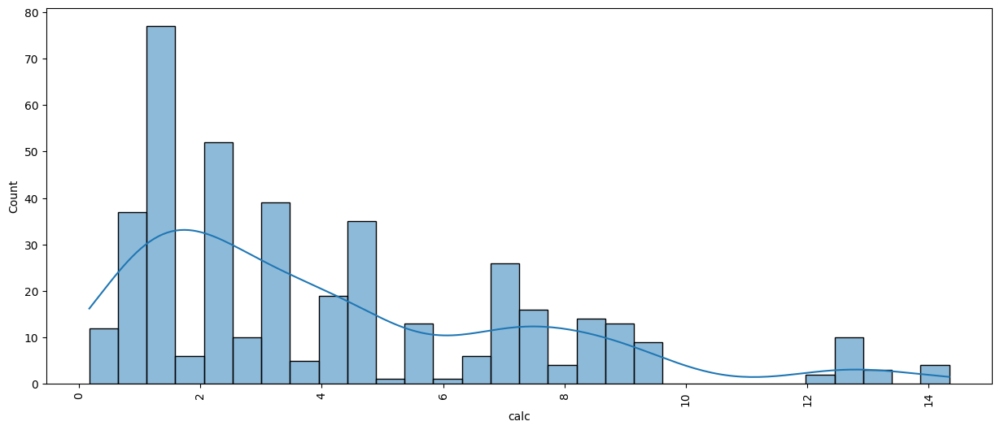

In [185]:
for i in df.columns:
    if i != 'target':
        plt.figure(figsize=(15,6))
        sns.histplot(df[i], kde=True, bins=30, palette='hls')
        plt.xticks(rotation=90)
        plt.show()

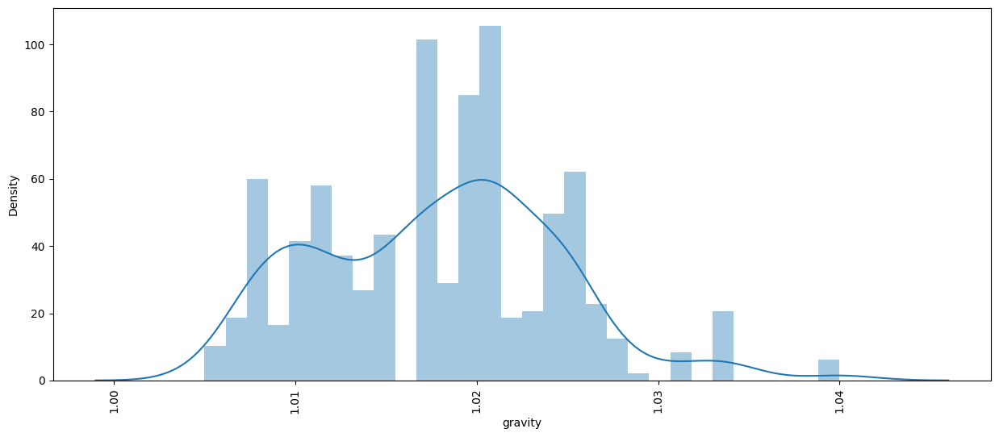

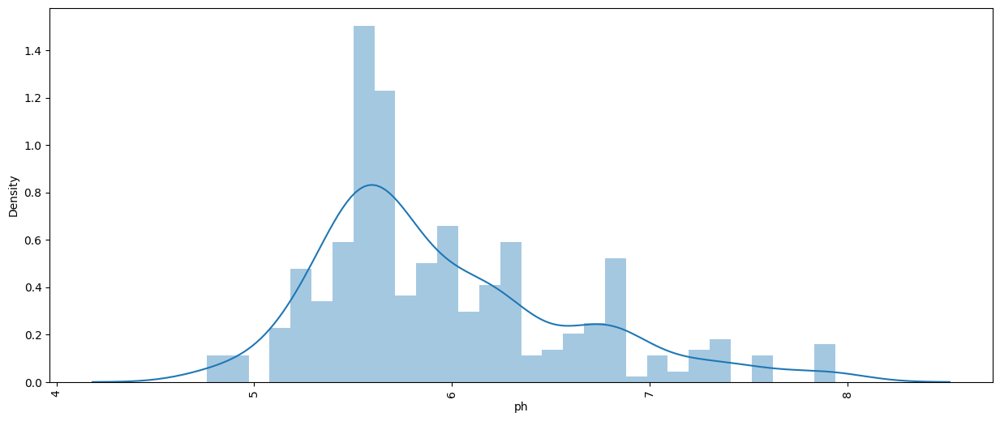

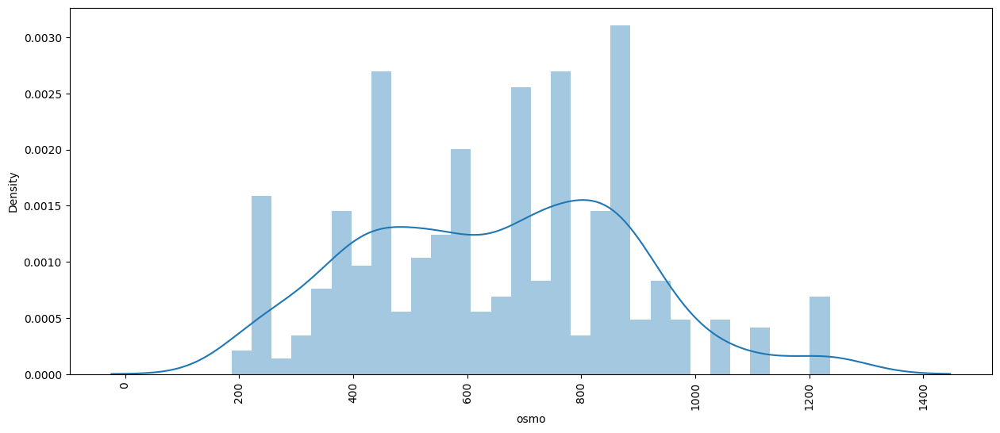

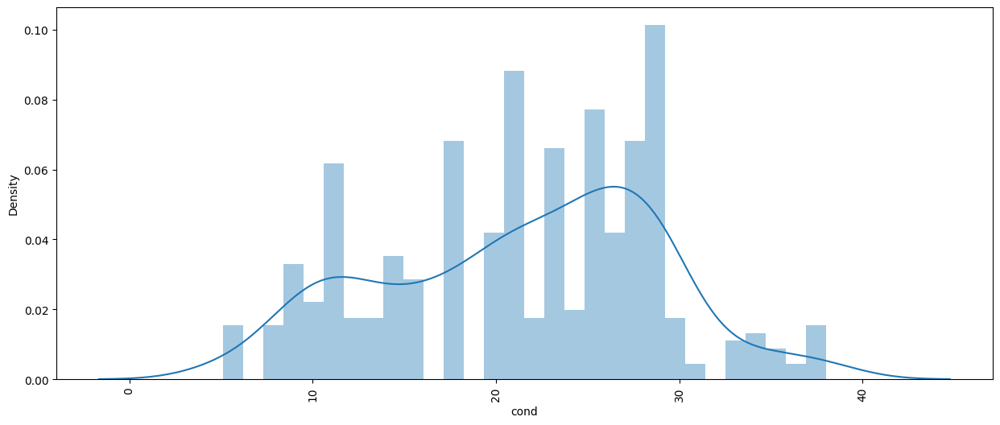

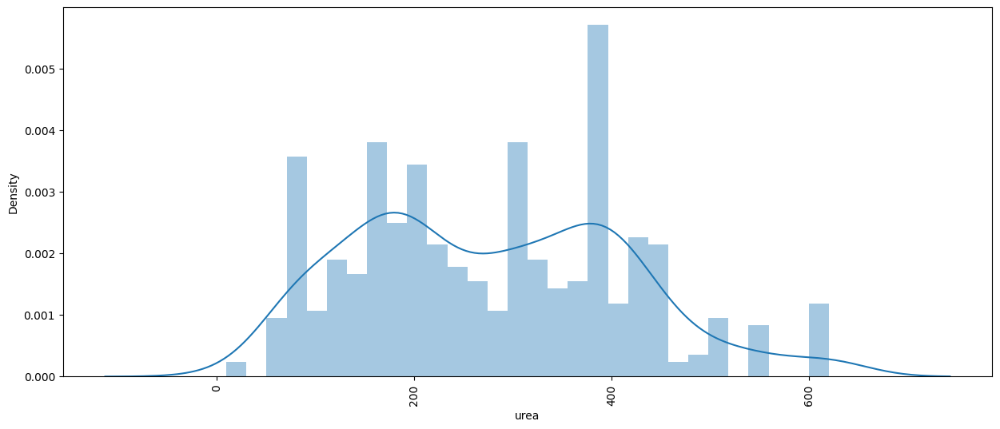

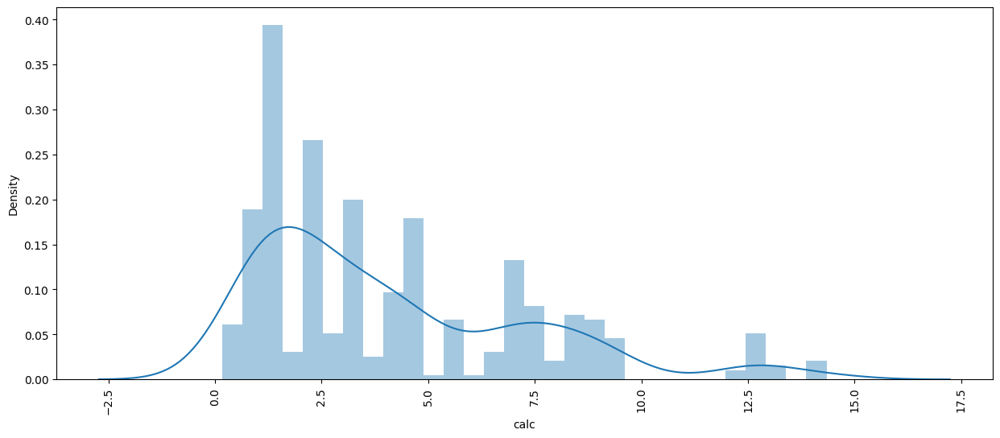

In [186]:
for i in df.columns:
    if i != 'target':
        plt.figure(figsize=(15,6))
        sns.distplot(df[i], kde=True, bins=30)
        plt.xticks(rotation=90)
        plt.show()

In [187]:
# histogram plot -- represents the values or no. of values lying within a specific range or interval
# distribution plot -- represents the area denoted by the data/values under a specific range or interval
# box plot -- represent the distribution of values (useful in identification of outliers)

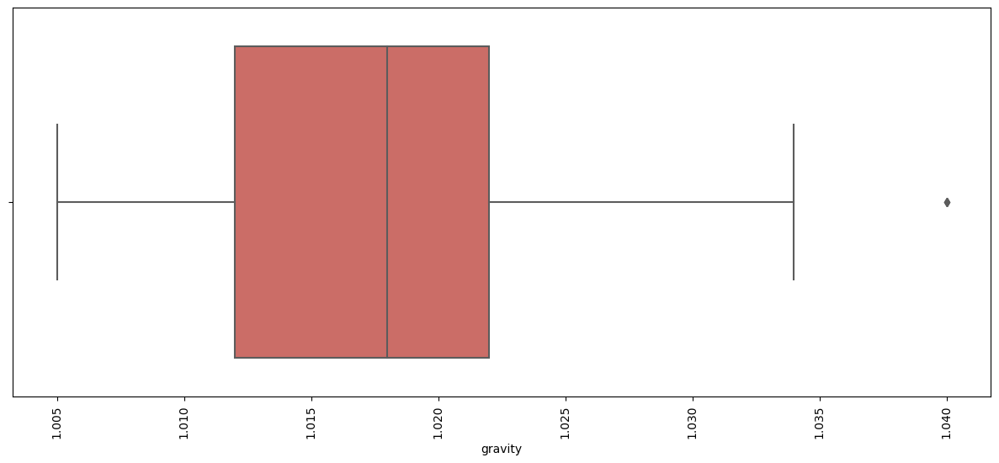

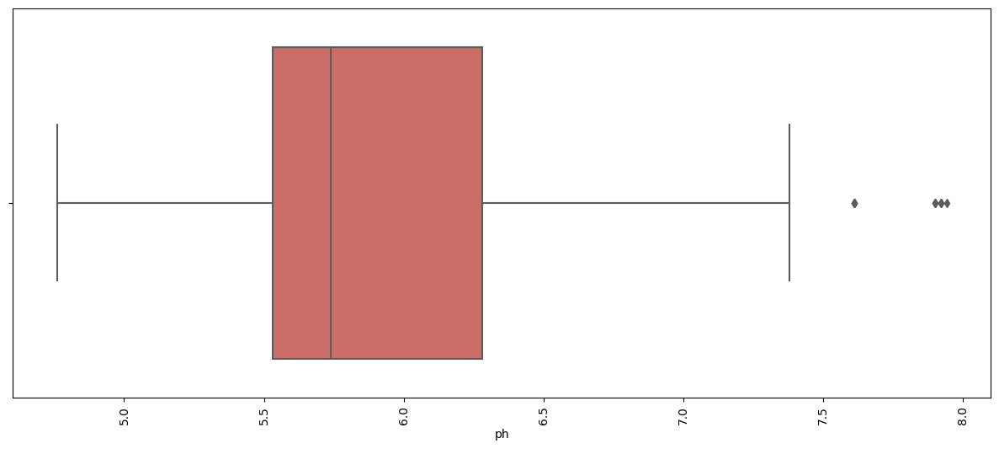

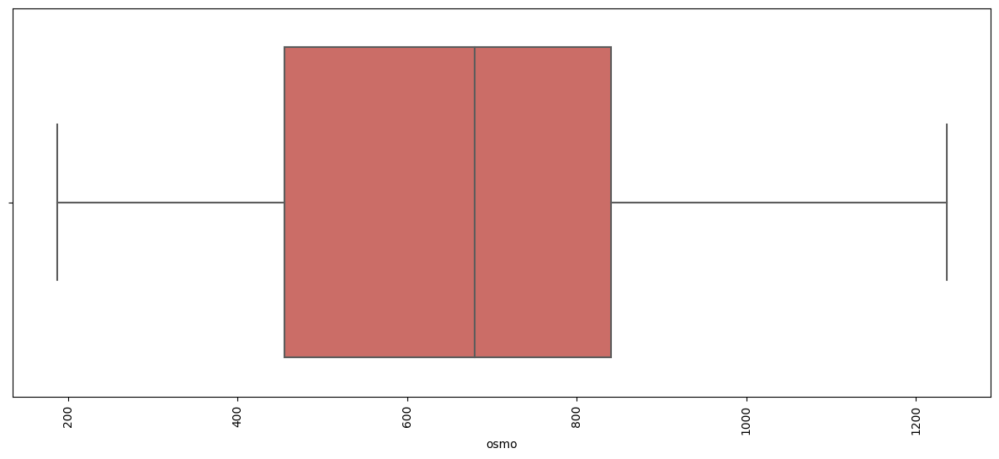

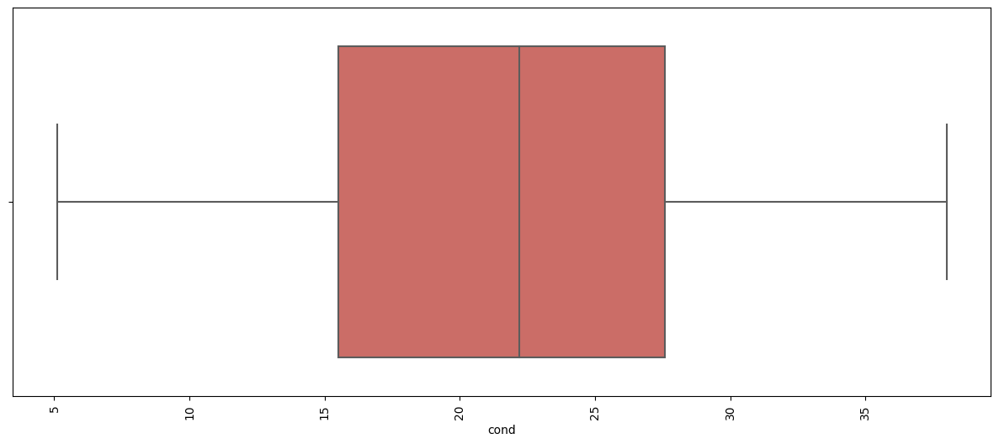

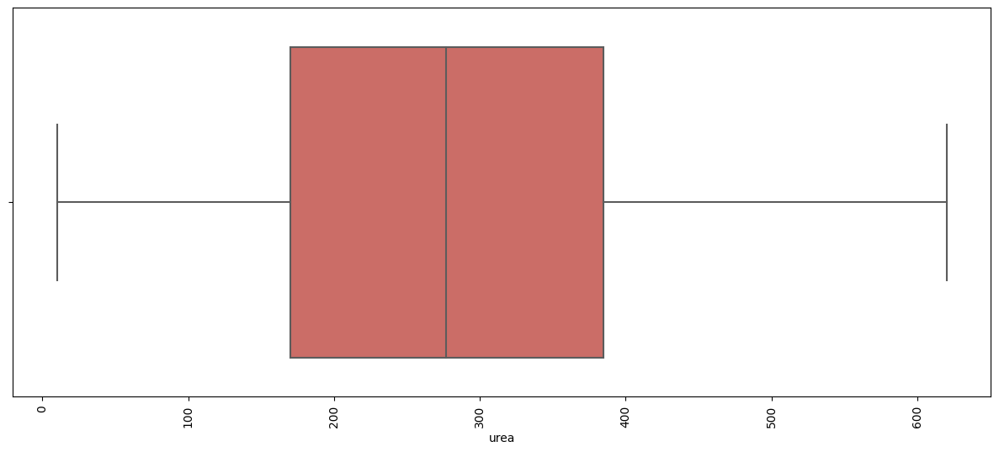

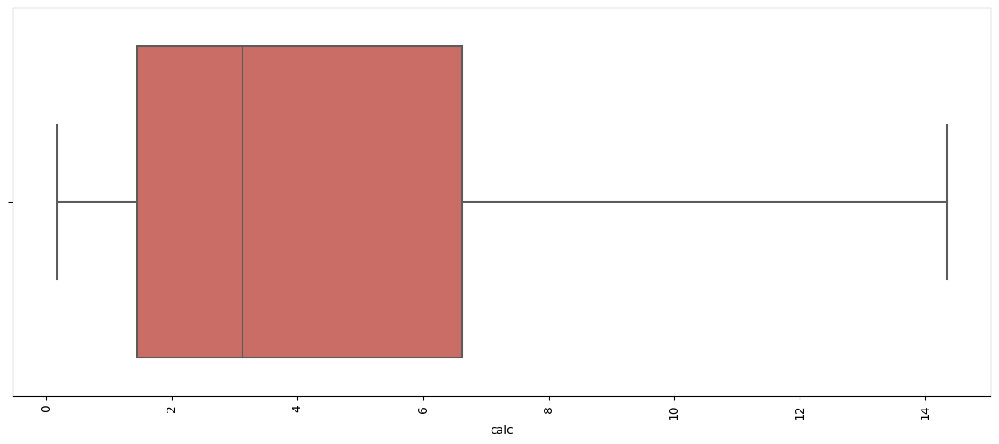

In [188]:
for i in df.columns:
    if i != 'target':
        plt.figure(figsize=(15,6))
        sns.boxplot(x=df[i], data=df, palette='hls')
        plt.xticks(rotation=90)
        plt.show()
        
# the box in a box plot denotes that the majority of the values lie within this range

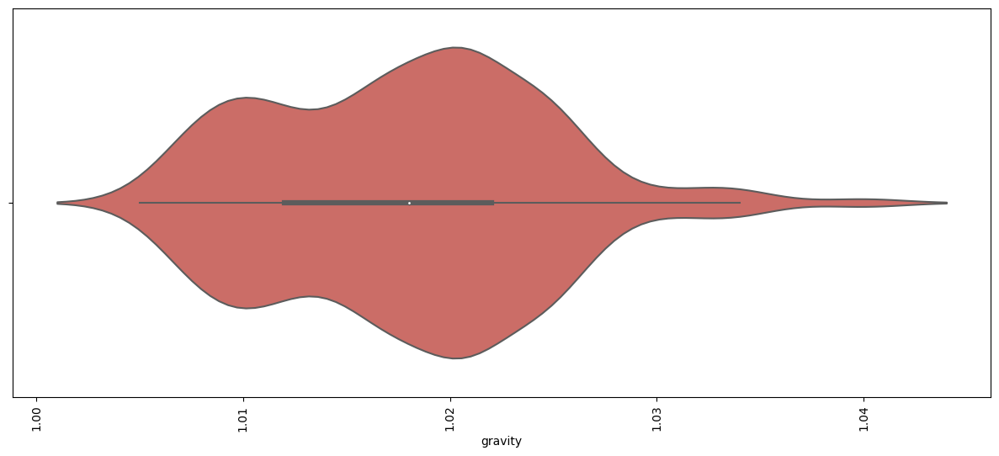

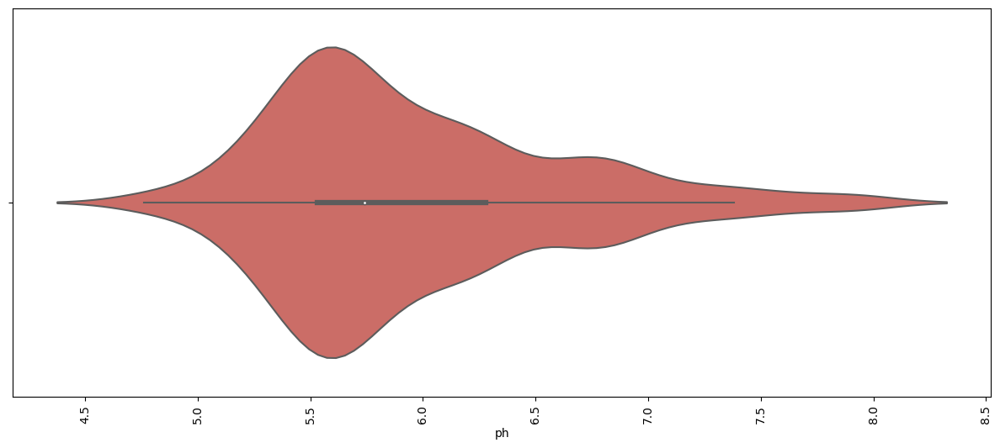

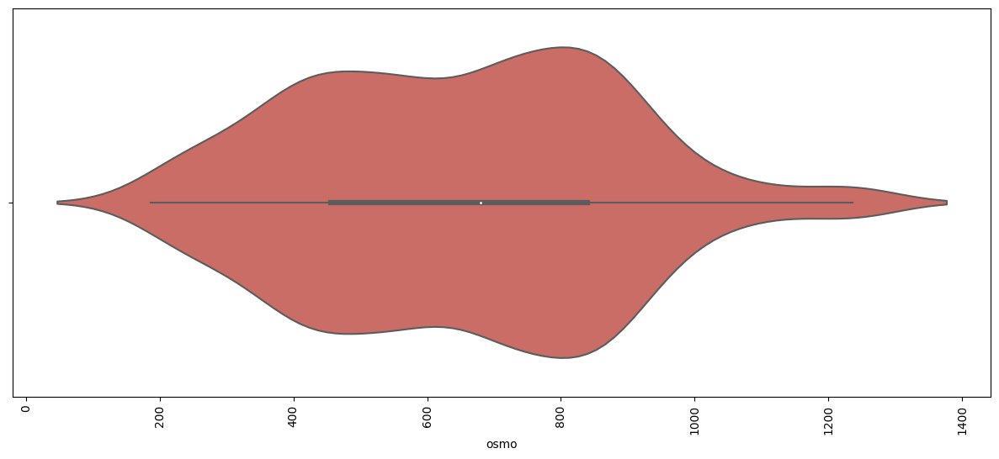

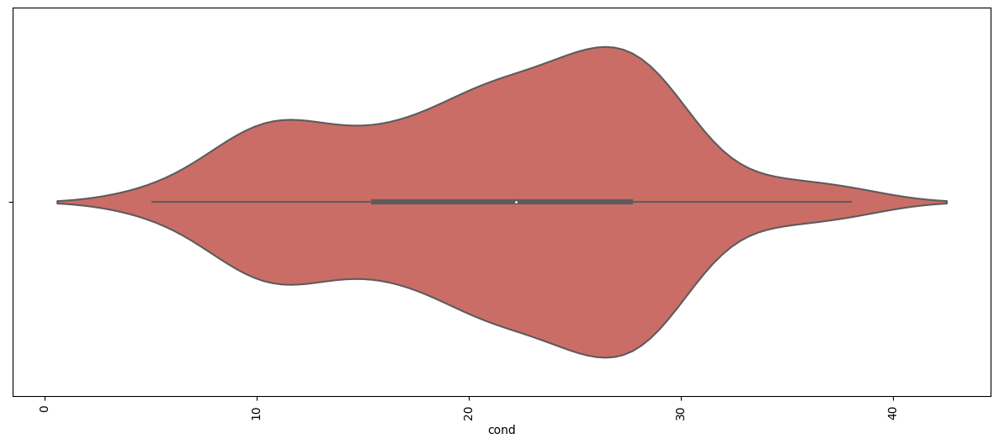

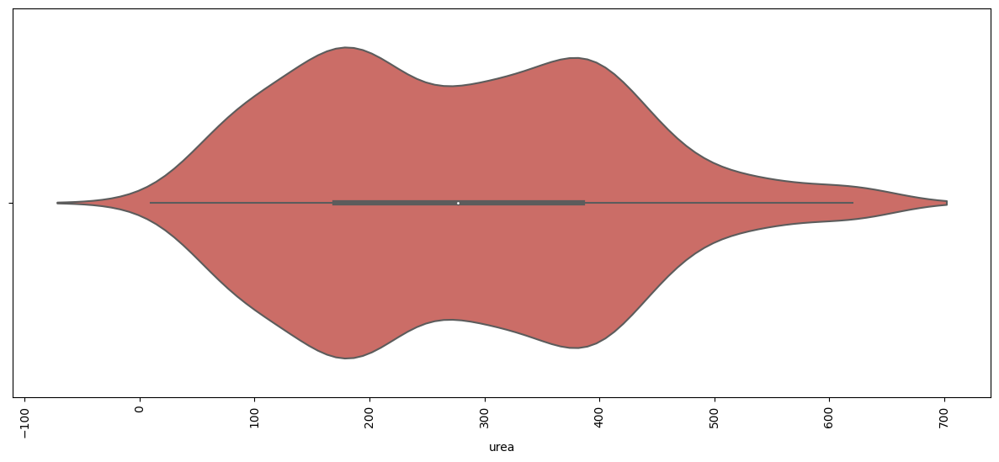

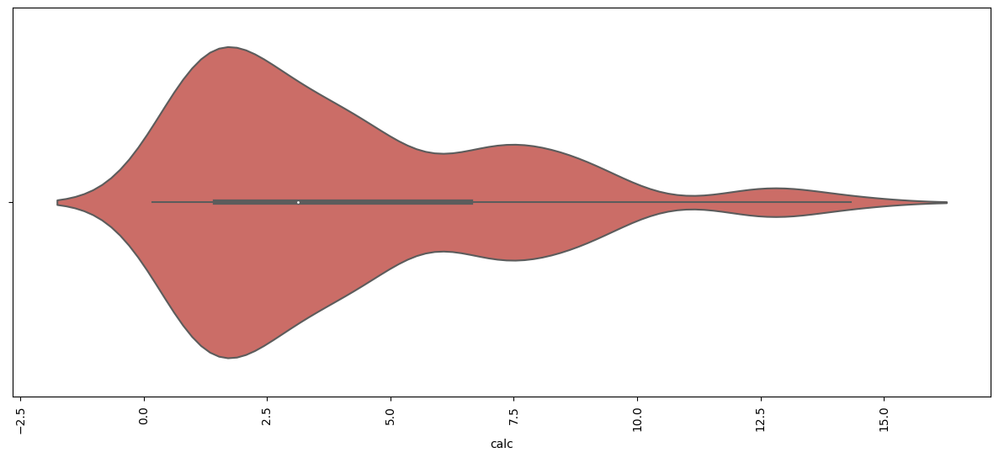

In [189]:
for i in df.columns:
    if i != 'target':
        plt.figure(figsize=(15,6))
        sns.violinplot(x=df[i], data=df, palette='hls')
        plt.xticks(rotation=90)
        plt.show()

In [190]:
for i in df.columns:
    if i != 'target':
        fig = px.histogram(data_frame=df, x=df[i], nbins=20, marginal='box', opacity=0.5, color_discrete_sequence=['#636EFA'])
        fig.update_layout(title= f'Histogram of {i}',
                          title_x = 0.5,
                          xaxis_title = i,
                          yaxis_title = 'Count',
                          showlegend = False)
        fig.show()

# marginal='box' -- this syntax adds up a box plot to the histogram plot
# opacity=0.7 -- this syntax denotes the opacity of the histogram bars

In [191]:
for i in df.columns:
    if i != 'target':
        fig = px.histogram(data_frame=df, x=df[i], opacity=0.5, nbins=20, color_discrete_sequence=['#636EFA'],
                           title=f'Histogram of {i}', labels={'x':i, 'Count':'Frequency'}, template='plotly_white',
                           width=1200, height=500, marginal='rug', barmode='overlay', hover_data=[df['target']])
        fig.update_layout(xaxis=dict(type='category', title=i, tickangle=-90, tickfont=dict(size=10)), title_x=0.5,
                          yaxis_title='Frequency', showlegend=False)
        fig.show()

# marginal='rug' -- adds margins in the form of a rugged plot displaying the distribution of individual data points
# hover_data=[df['target']] -- displaying values for the margins with respect to the corresponding target values

In [192]:
for i in df.columns:
    if i != 'target':
        fig = px.violin(df, x='target', y=i, box=True, points='all', hover_data=df.columns)
        fig.update_layout(xaxis_title='target', yaxis_title=i, title_x=0.5)
        fig.show()

In [193]:
# bivariate analysis
    # continuous vs. discrete variable -- bar plots are drawn
    # continuous vs. continuous variable -- line/scatter plots are drawn

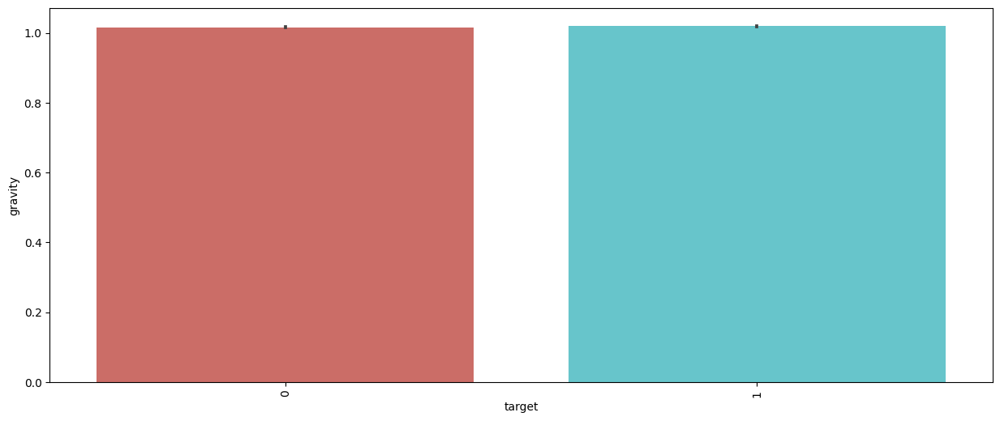

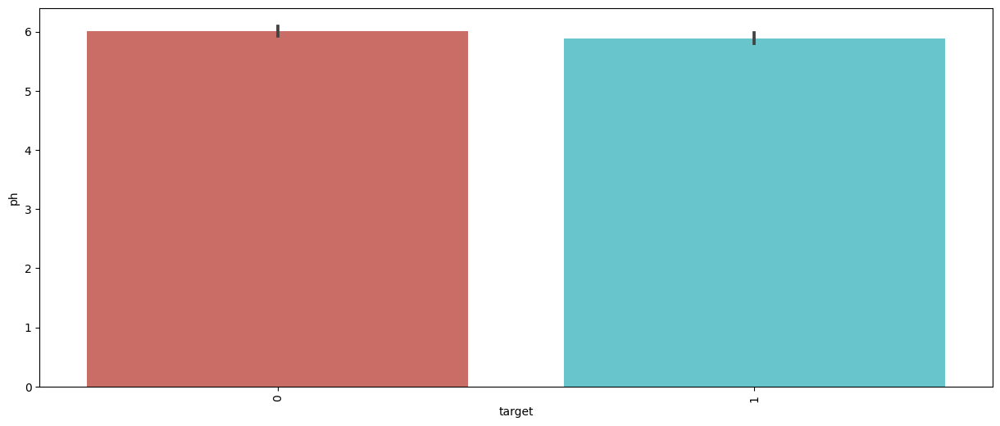

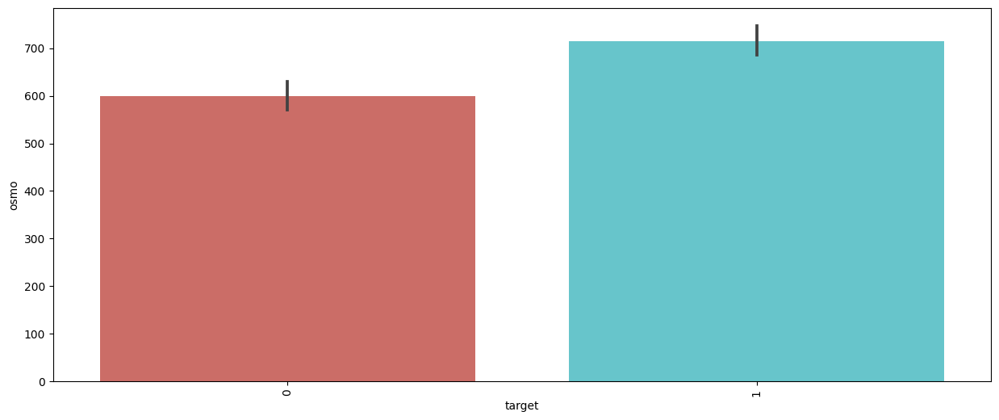

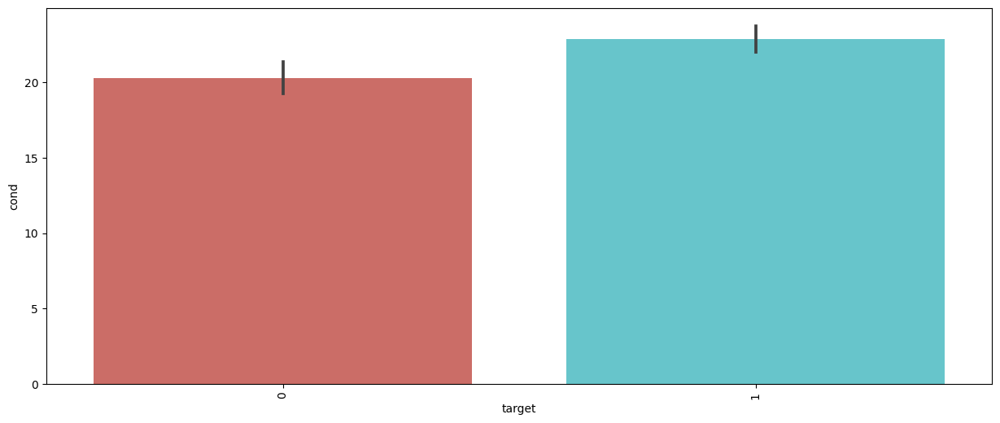

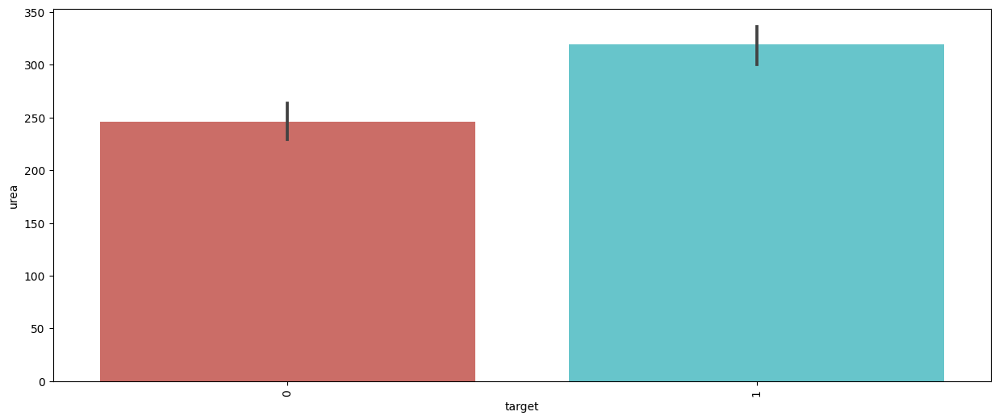

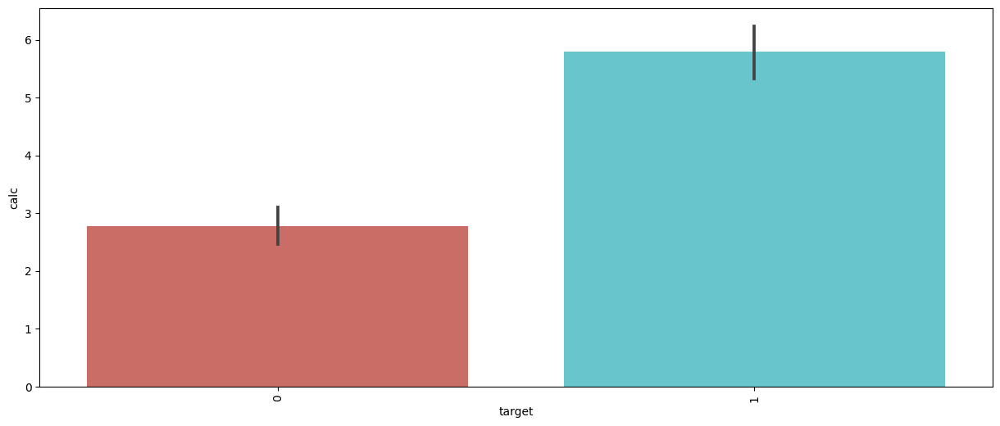

In [194]:
for i in df.columns:
    if i != 'target':
        plt.figure(figsize=(15,6))
        sns.barplot(data=df, x=df['target'], y=df[i], palette='hls')
        plt.xticks(rotation=90)
        plt.show()

In [195]:
for i in df.columns:
    if i != 'target':
        fig = px.bar(df, x=df['target'], y=df[i], color='target', barmode='group')
        fig.update_layout(title=f'{i} vs. target', title_x=0.5,
                          xaxis_title='target', yaxis_title=i,
                          legend_title='target')
        fig.show()

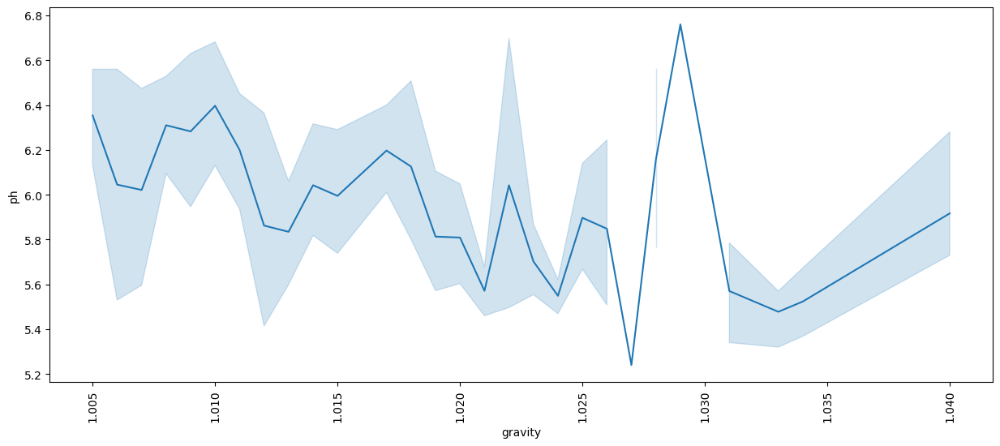

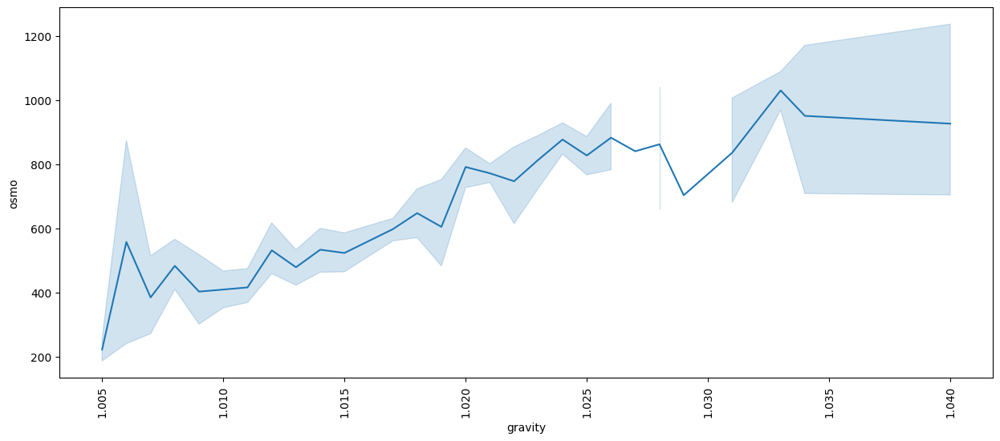

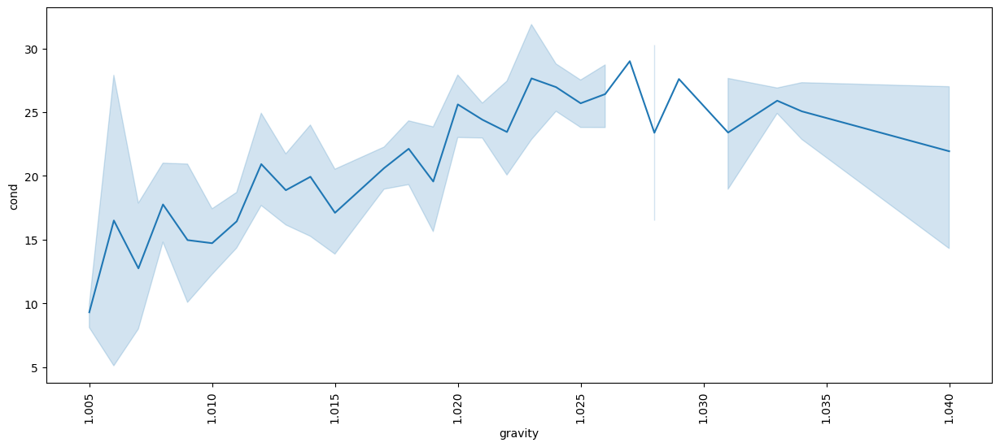

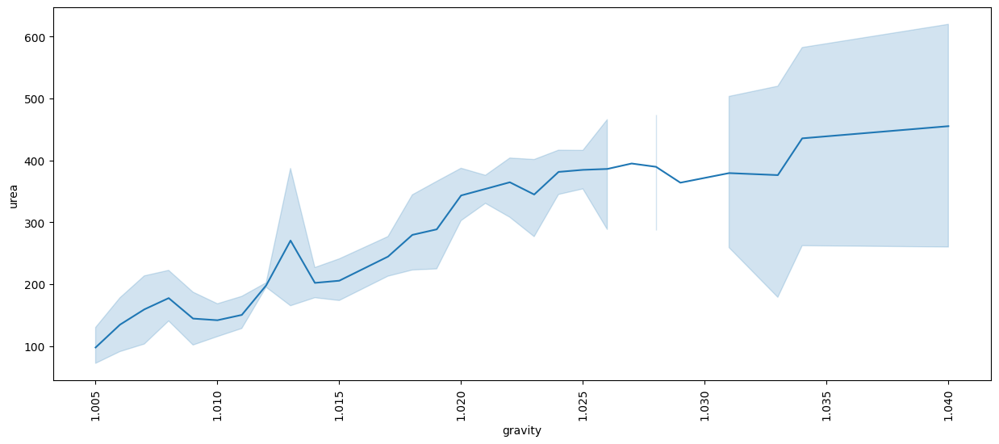

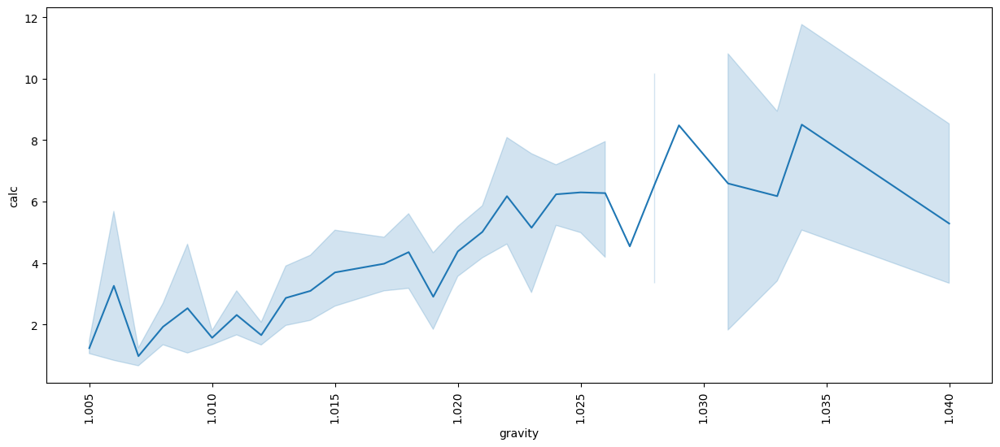

...

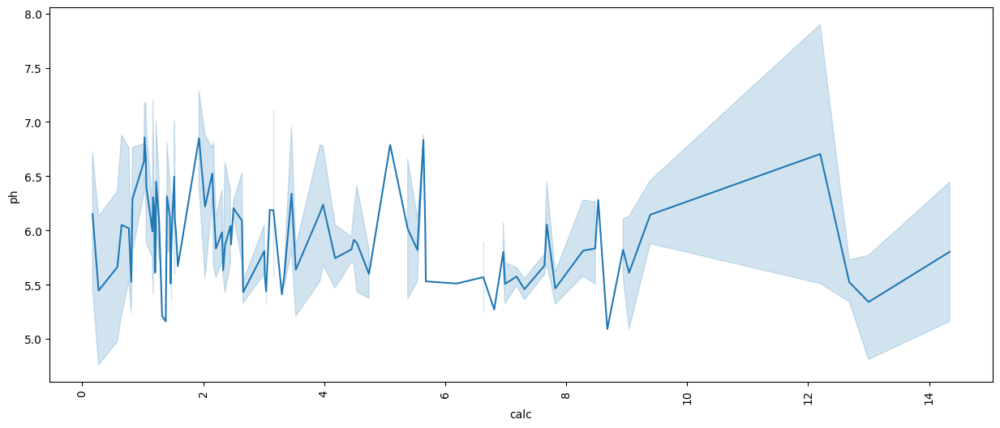

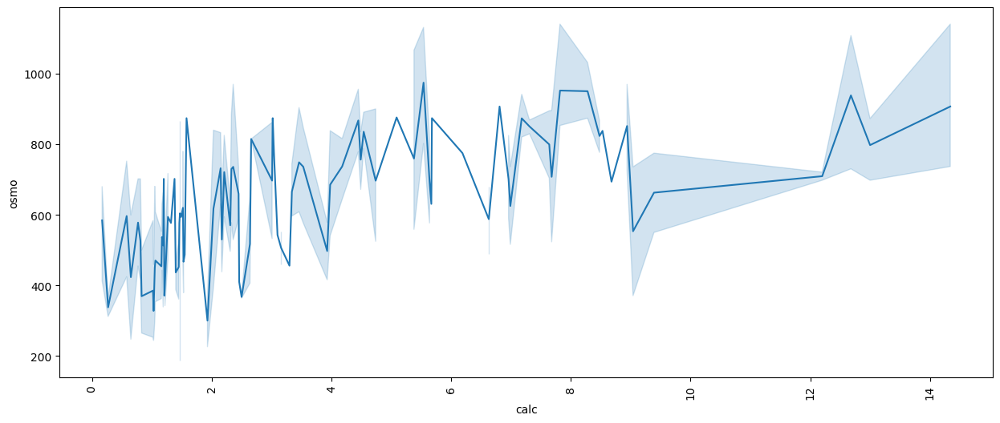

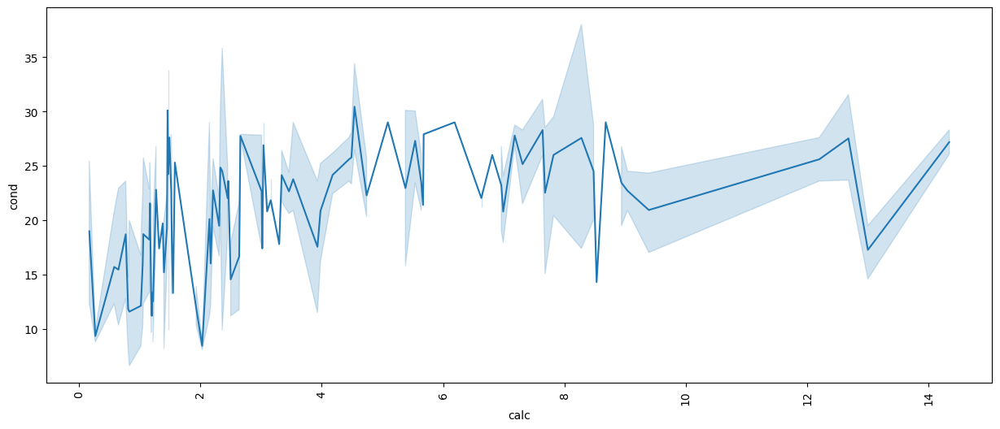

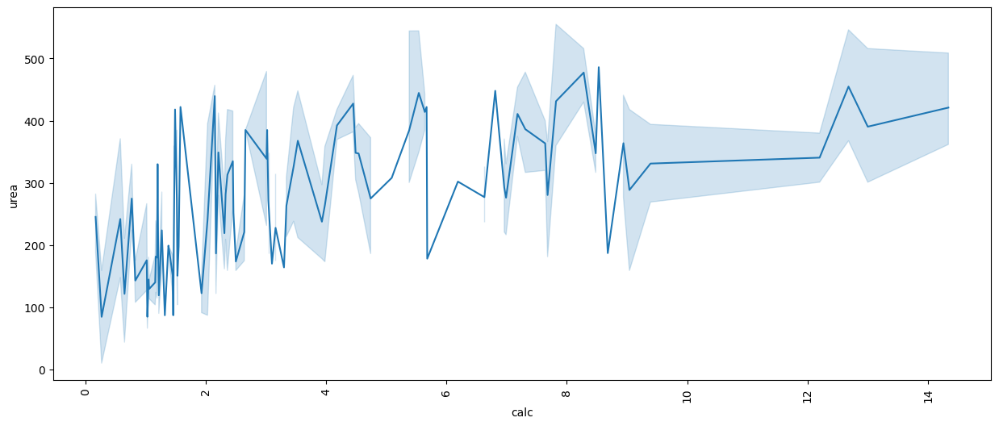

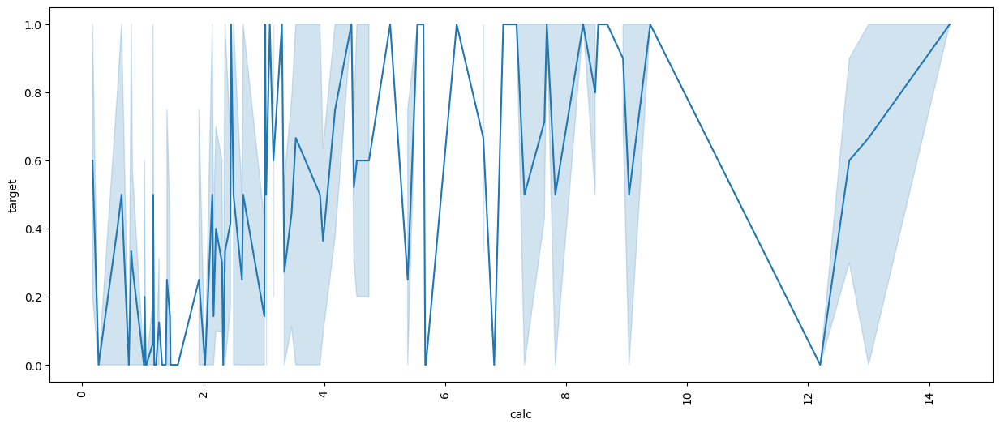

In [196]:
for i in df.columns:
    for j in df.columns:
        if i != j:
            if i != 'target':
                plt.figure(figsize=(15,6))
                sns.lineplot(data=df, x=i, y=j, palette='hls')
                plt.xticks(rotation=90)
                plt.show()

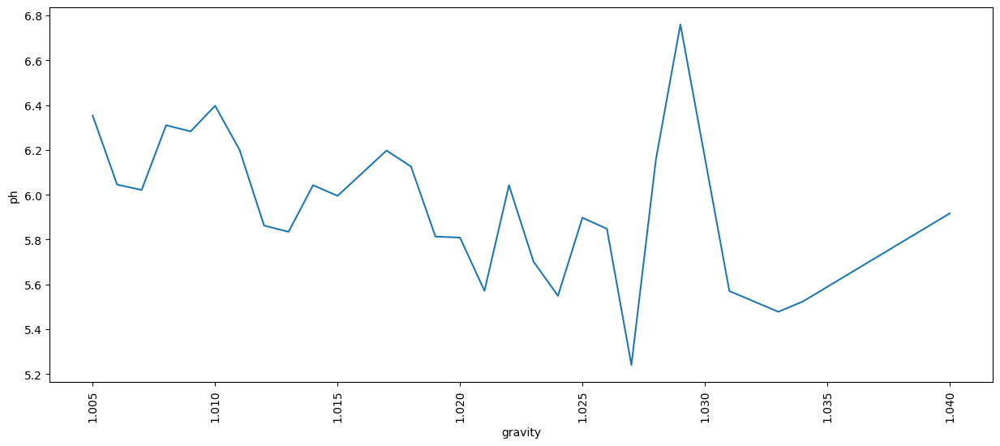

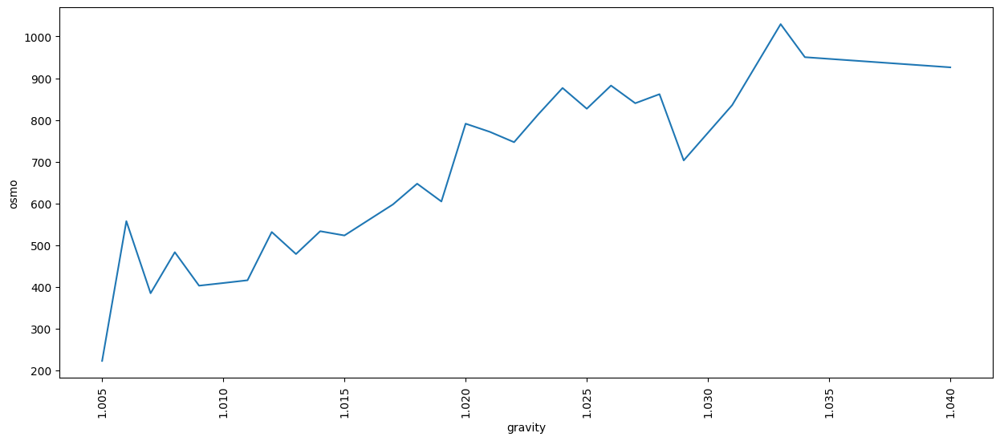

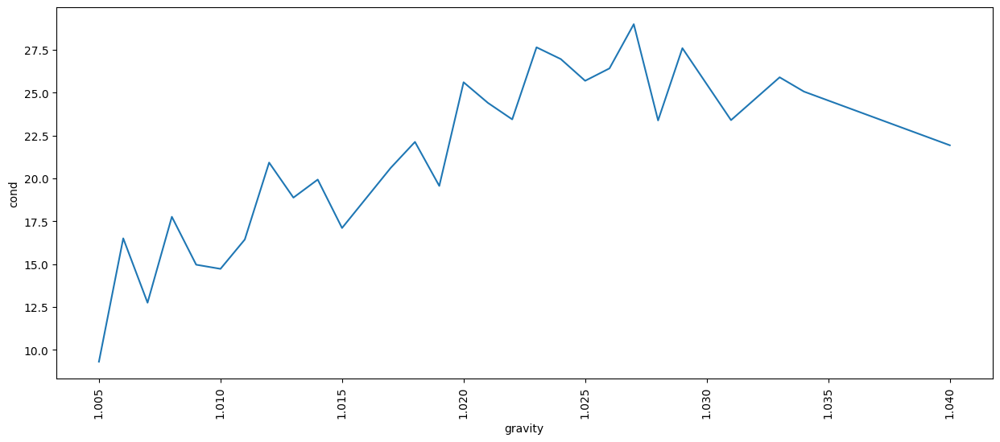

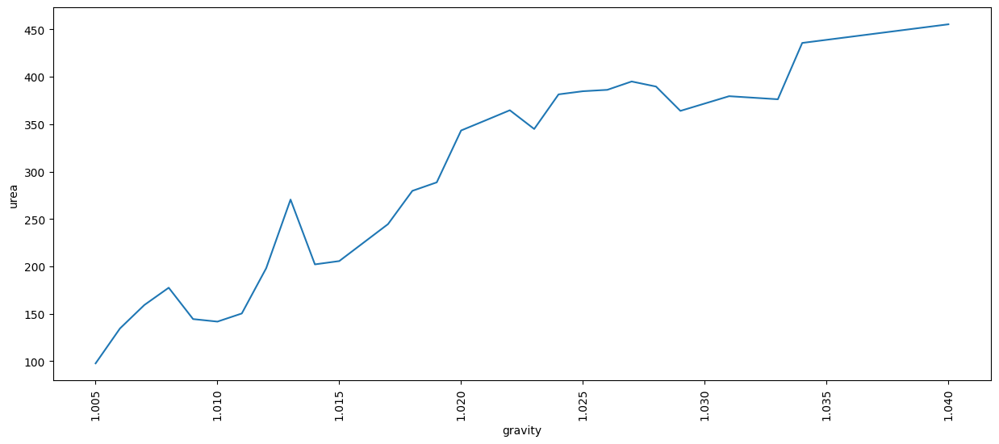

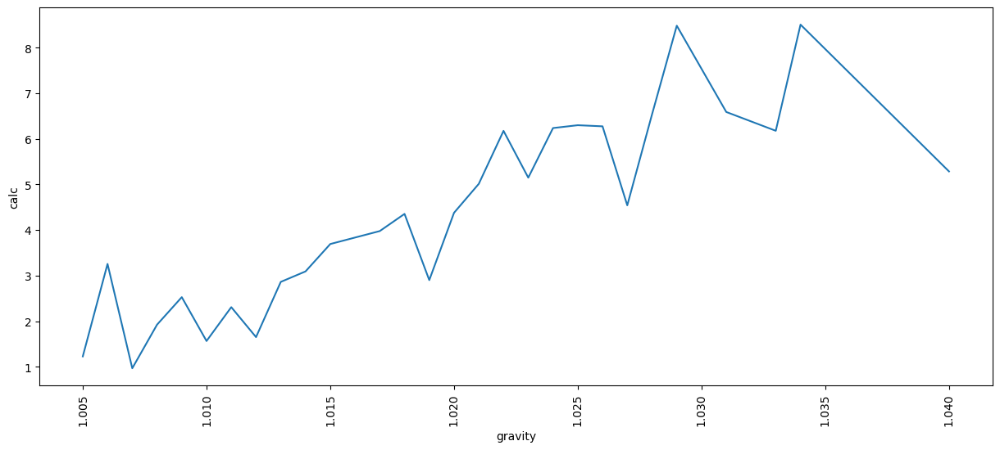

...

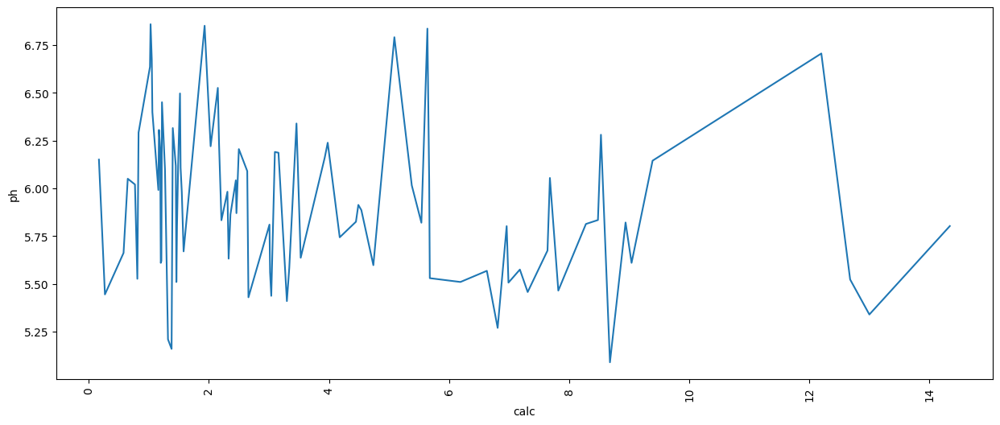

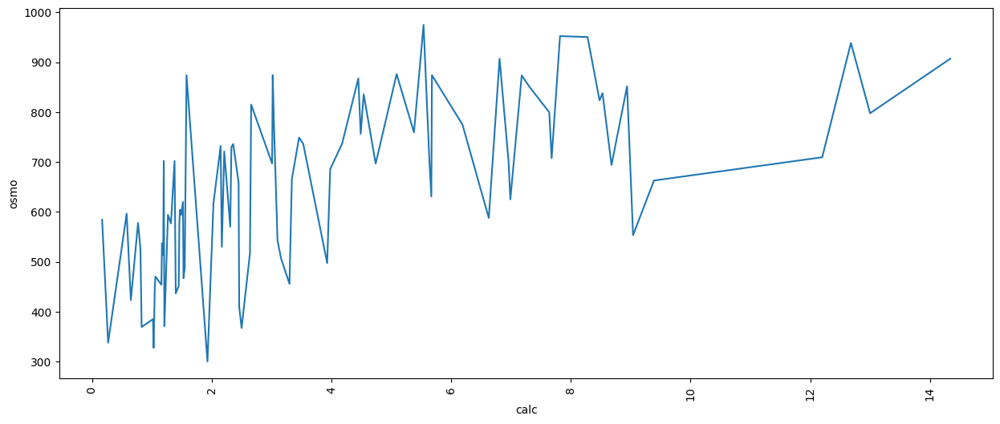

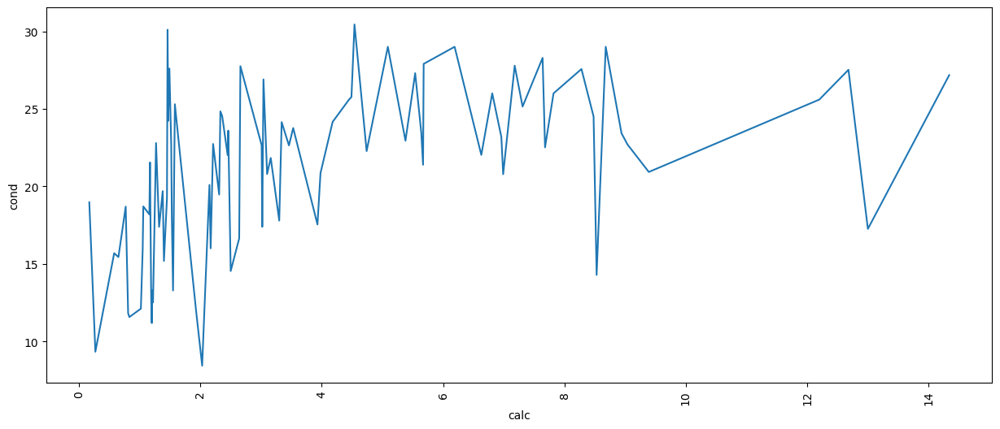

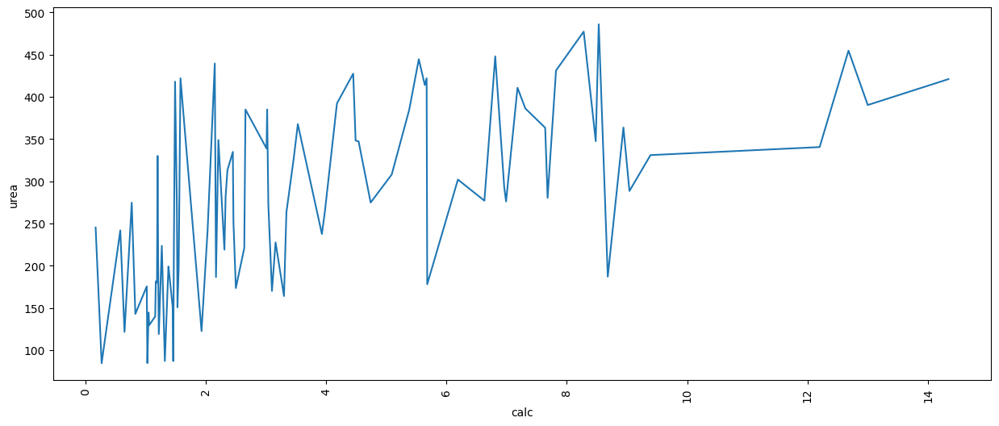

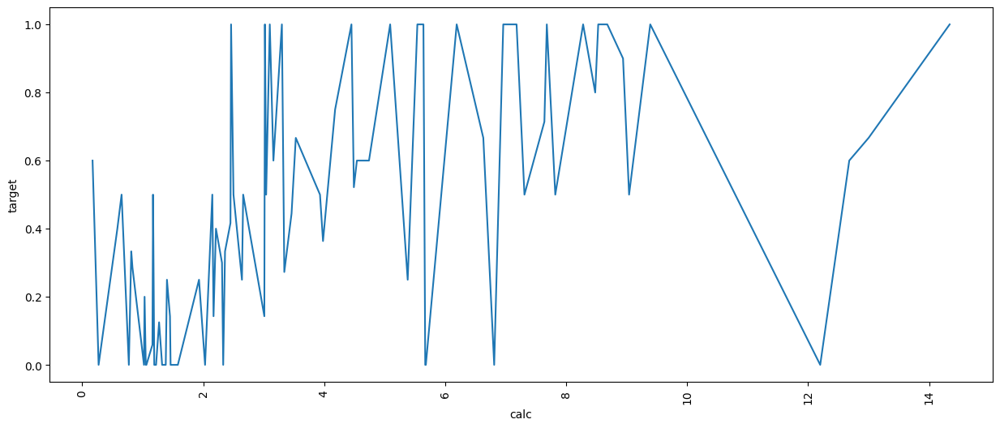

In [197]:
for i in df.columns:
    for j in df.columns:
        if i != j:
            if i != 'target':
                plt.figure(figsize=(15,6))
                sns.lineplot(data=df, x=i, y=j, ci=None, palette='hls')
                plt.xticks(rotation=90)
                plt.show()

# ci=None -- disables the shaded region as shown under line plots drawn above 

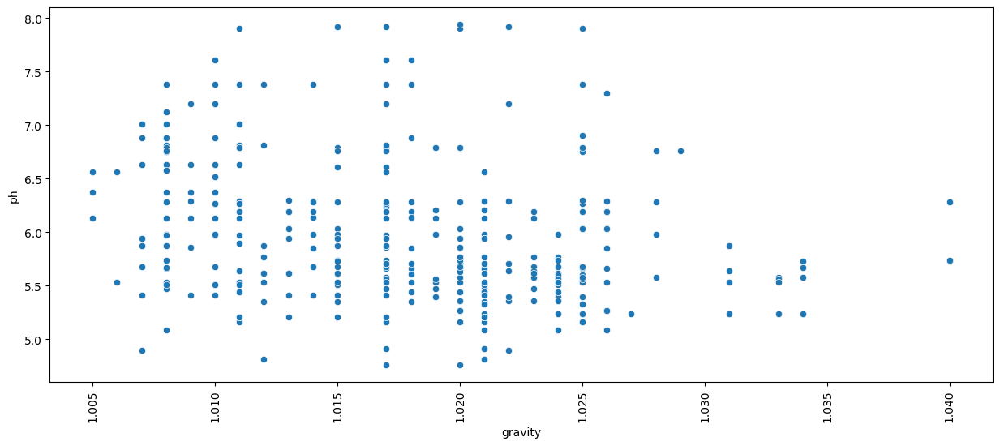

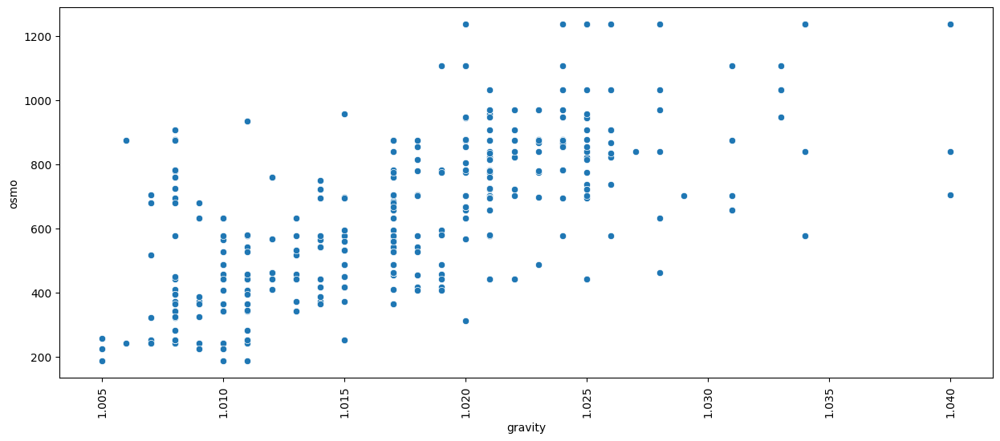

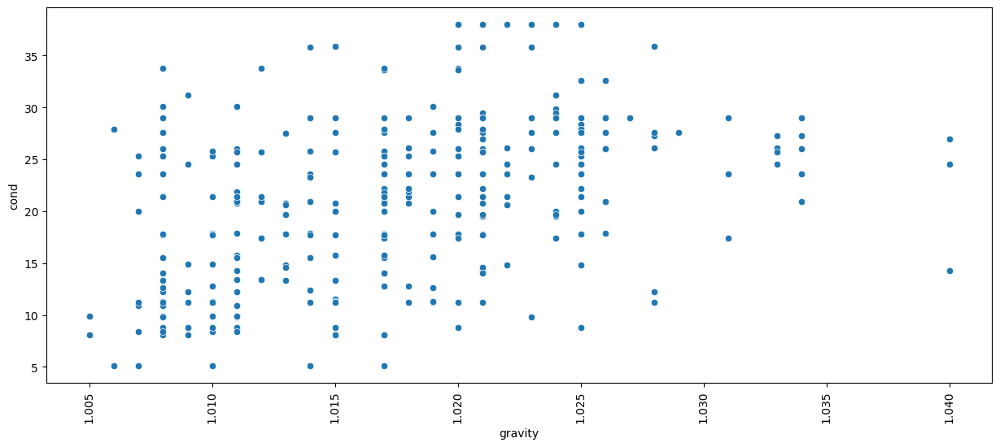

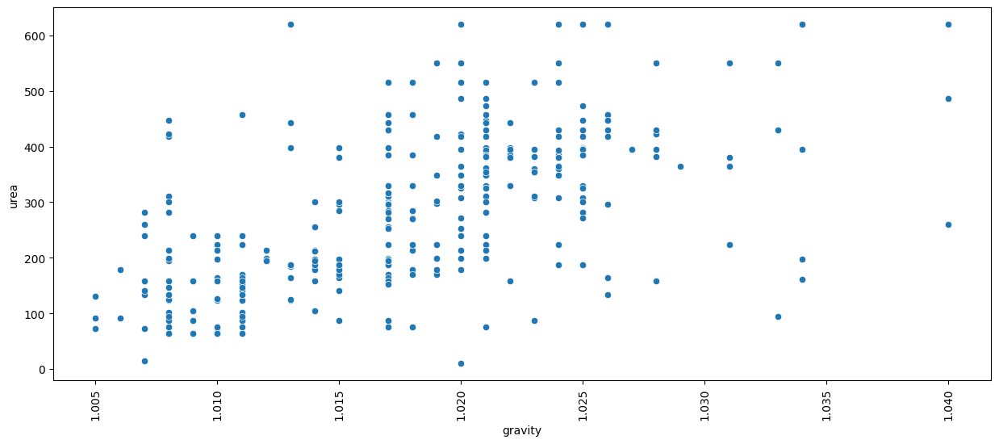

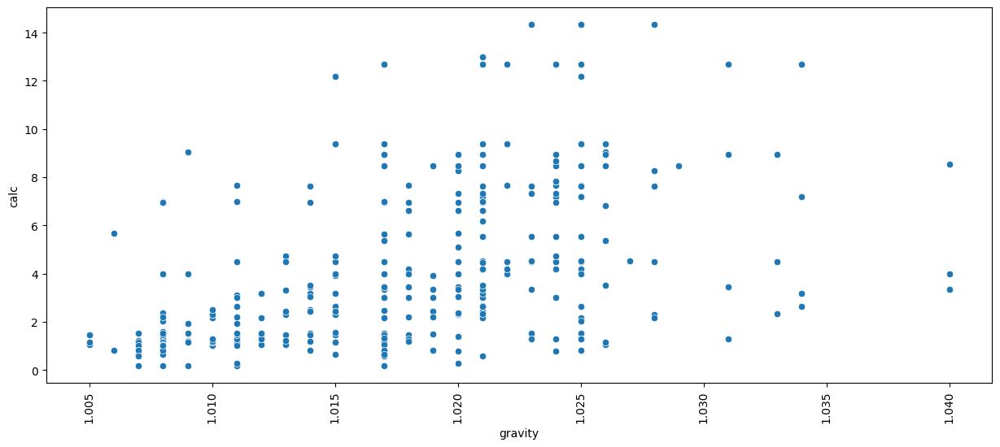

...

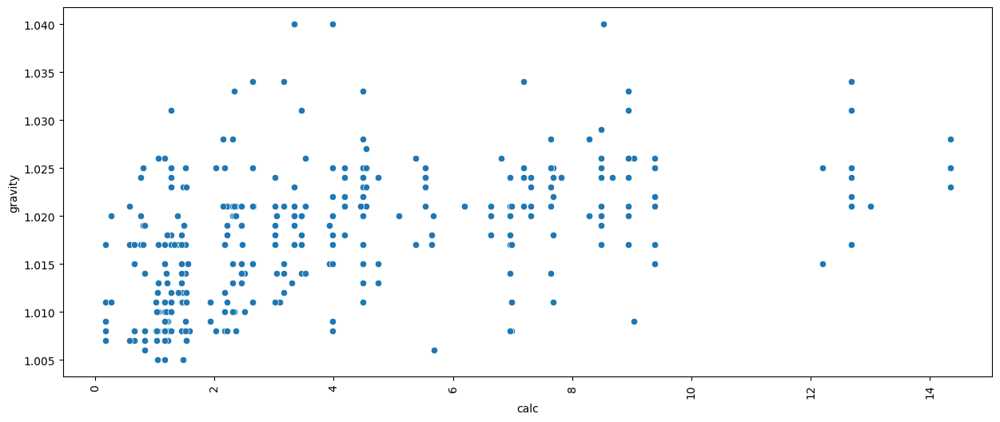

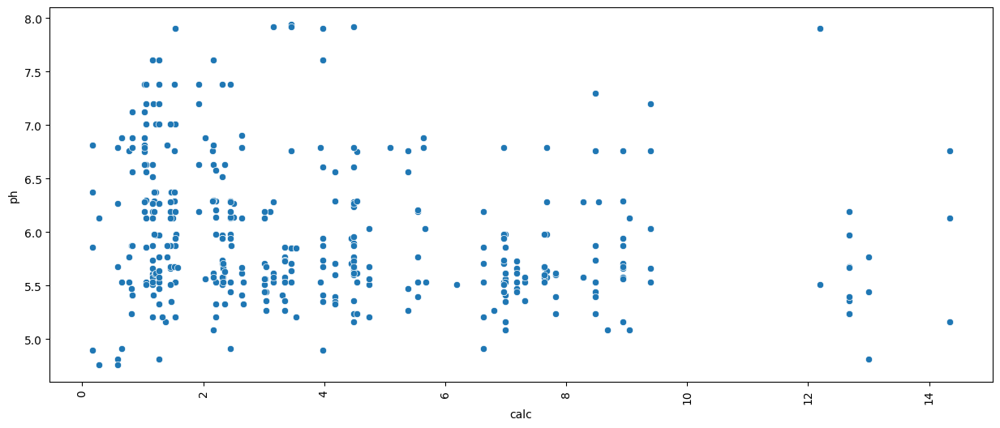

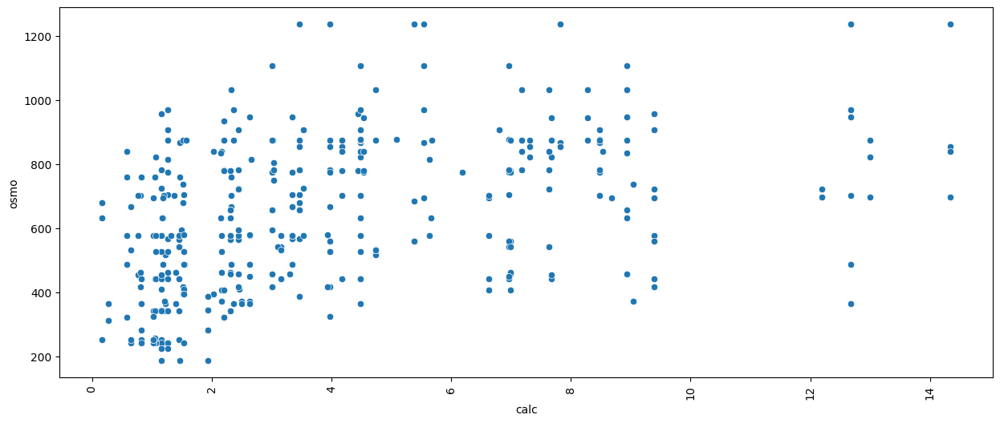

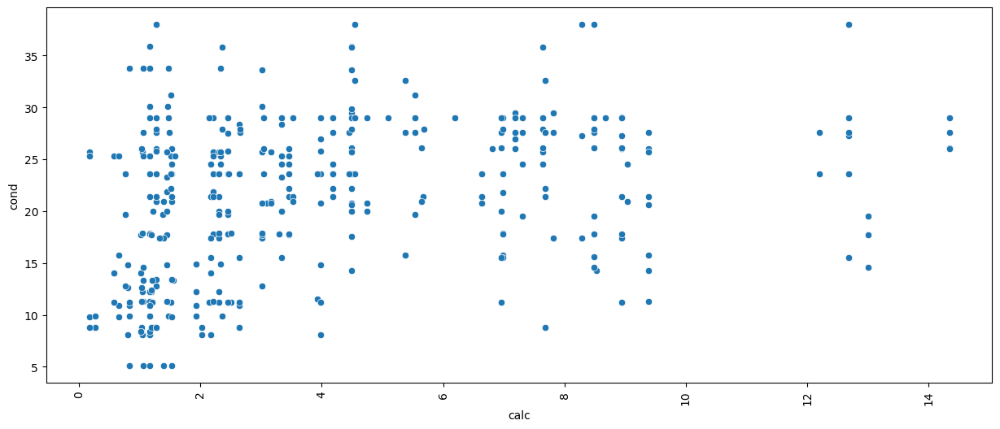

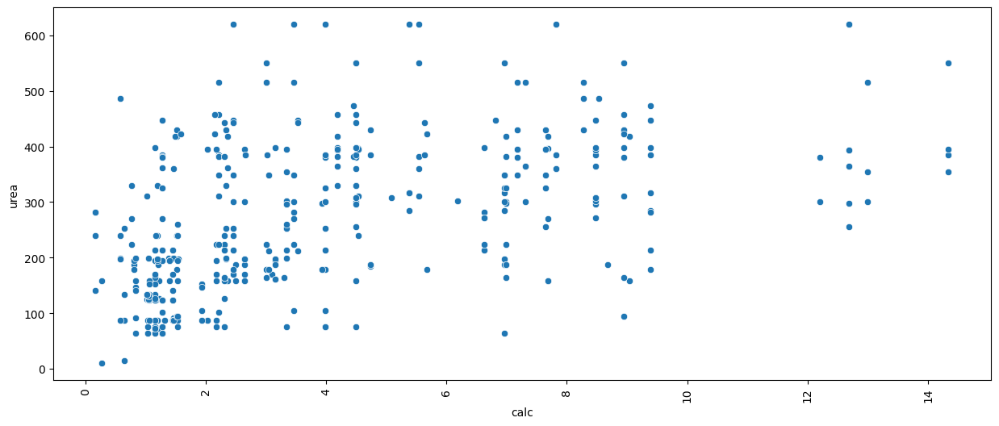

In [198]:
for i in df.columns:
    for j in df.columns:
        if i != j:
            if i != 'target':
                if j != 'target':
                    plt.figure(figsize=(15,6))
                    sns.scatterplot(data=df, x=i, y=j, palette='hls')
                    plt.xticks(rotation=90)
                    plt.show()

In [199]:
# drawing line plot using plotly

for i in df.columns:
    for j in df.columns:
        if i != 'target':
            if j!= 'target':
                if i != j:
                    fig = px.line(data_frame=df, x=i, y=j, template='plotly_white', color='target')
                    fig.update_layout(title=f'{j} vs. {i}', title_x=0.5,
                                    xaxis_title=i,
                                    yaxis_title=j)
                    fig.show()

In [200]:
# drawing scatter plot using plotly

for i in df.columns:
    for j in df.columns:
        if i != 'target':
            if j!= 'target':
                if i != j:
                    fig = px.scatter(data_frame=df, x=i, y=j, color_discrete_sequence=['#636EFA', '#EF553B'], color='target')
                    fig.update_layout(title=f'{j} vs. {i}', title_x=0.5,
                                    xaxis_title=i,
                                    yaxis_title=j)
                    fig.show()

In [201]:
# drawing 3-D plots using plotly
import plotly.graph_objs as go

In [202]:
fig = go.Figure(data=[go.Scatter3d(
    x=df['gravity'],
    y=df['ph'],
    z=df['osmo'],
    mode='markers',
    marker=dict(
        size=5,
        color=df['target'],
        colorscale='Viridis',
        opacity=0.7
    )
)])

fig.update_layout(
    title='3D Scatter Plot', title_x=0.5,
    scene=dict(
        xaxis_title='Gravity',
        yaxis_title='pH',
        zaxis_title='Osmo'
    )
)

fig.show()

<Figure size 1500x600 with 0 Axes>

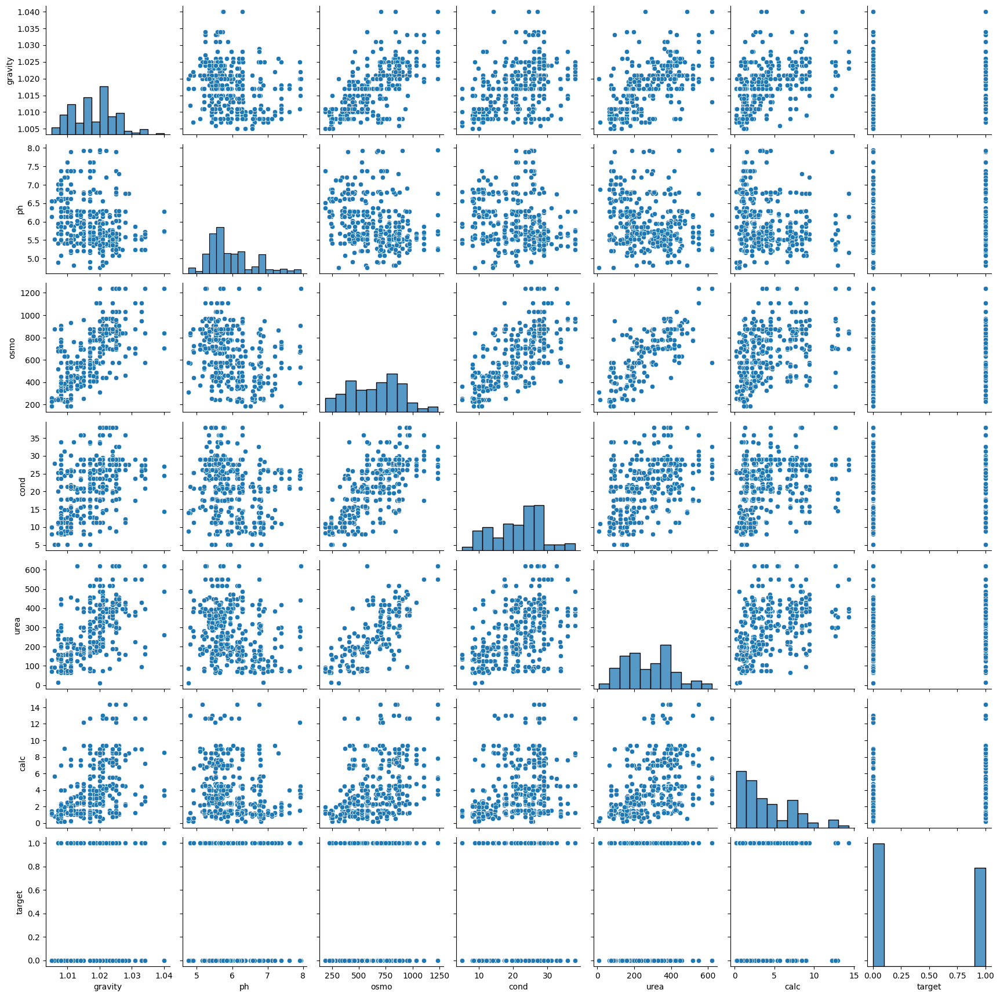

In [203]:
plt.figure(figsize=(15,6))
sns.pairplot(data=df, palette='hls')
plt.xticks(rotation = 90)
plt.show()

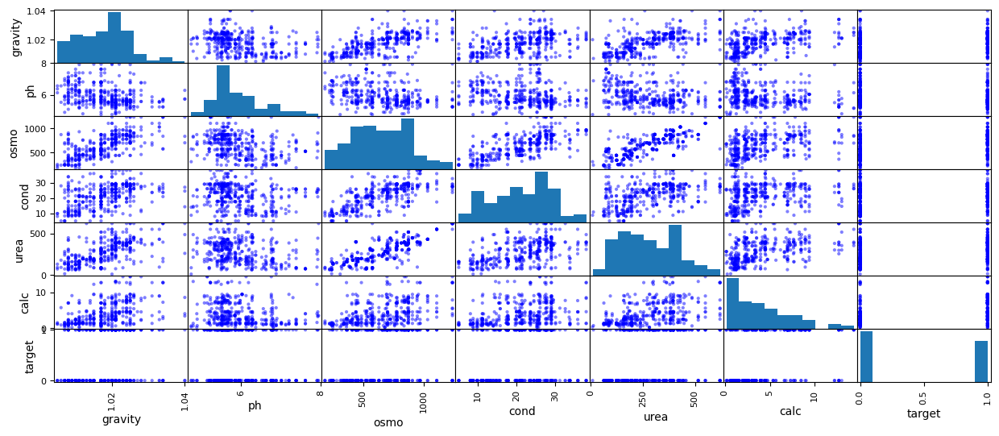

In [204]:
# drawing similar to pairplot using plotly

from pandas.plotting import scatter_matrix
scatter_matrix(df, diagonal='hist', color='b', alpha=0.5, figsize=(15,6))
fig = go.Figure(data=px.scatter_matrix(df, color='target', dimensions=['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc']))
fig.update_layout(title='Pairplot of Features', title_x=0.5, width=1150, height=1150)
fig.show()

# scatter_matrix -- module responsible for generating a mtrix of scatter plots

In [205]:
# outlier detection

Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print('Interquartile range for each of the features:')
print(IQR)

Interquartile range for each of the features:
gravity      0.01
ph           0.75
osmo       384.75
cond        12.10
urea       215.00
calc         5.18
target       1.00
dtype: float64


In [206]:
# removal of outliers and storing the result in a new dataframe (Turkish Rule)

df_new = df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis = 1)]

In [207]:
df_new.shape

(399, 7)

#### Hypothesis Testing

**What is a hypothesis testing?**
Hypothesis testing is a statistical approach that defines a statement or an assumption that needs to be tested and verified by gathering some evidence. It usually helps dervie the relationship between two or more variables.

- H(0) denotes the null hypothesis statement that needs to be tested
- H(a) denotes the alternate hypothesis that is opposite to the null hypothesis

**t_statistic**: measure of the difference between mean of two groups (i.e. population mean - sample mean)

**p_value**: measure of the probability of observing a difference between mean of two groups

In [208]:
from scipy.stats import ttest_ind

In [209]:
group1 = df[df['target'] == 0]['urea']
group2 = df[df['target'] == 1]['urea']

In [210]:
mean1, std1 = group1.mean(), group1.std()
mean2, std2 = group2.mean(), group2.std()

In [211]:
t_stat, p_value = ttest_ind(group1, group2, equal_var=False)

In [212]:
print('Group 1 mean: {:.2f}, std: {:.2f}'.format(mean1, std1))
print('Group 2 mean: {:.2f}, std: {:.2f}'.format(mean2, std2))
print('t-statistic: {:.2f}, p-value: {:.2f}'.format(t_stat, p_value))

Group 1 mean: 246.33, std: 137.93
Group 2 mean: 319.07, std: 123.50
t-statistic: -5.65, p-value: 0.00


In [213]:
# p-value is less than 0.5 which indicates that the observed difference between mean of the two groups is not significant
# this means null hypothesis can be rejected and further indicates that there is a significant difference in urea concentration for the two groups
    # group 1: people who do not have any kidney stones present
    # group 2: people having stones present in their kidney

In [214]:
df_corr = df.corr()

In [215]:
df_corr

,gravity,ph,osmo,cond,urea,calc,target
gravity,1.000000,-0.290349,0.692317,0.470433,0.631710,0.494304,0.282577
ph,-0.290349,1.000000,-0.309495,-0.190185,-0.279749,-0.214402,-0.094983
osmo,0.692317,-0.309495,1.000000,0.708480,0.809880,0.472114,0.244770
cond,0.470433,-0.190185,0.708480,1.000000,0.499109,0.330609,0.172224
urea,0.631710,-0.279749,0.809880,0.499109,1.000000,0.489879,0.265211
calc,0.494304,-0.214402,0.472114,0.330609,0.489879,1.000000,0.467439
target,0.282577,-0.094983,0.244770,0.172224,0.265211,0.467439,1.000000


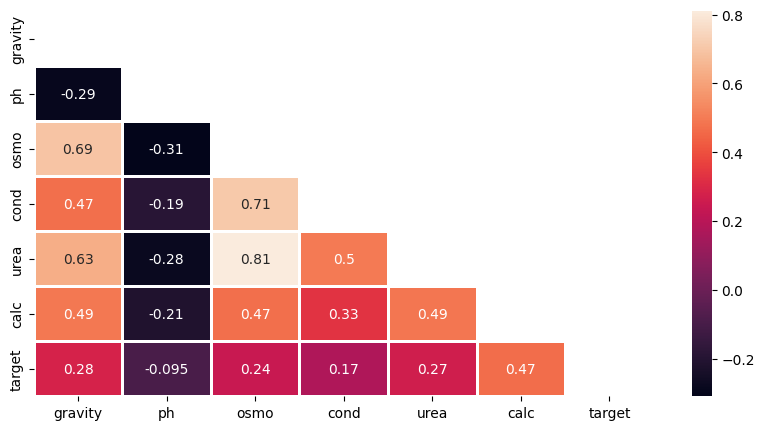

In [216]:
plt.figure(figsize=(10,5))
matrix = np.triu(df_corr)   # only considering the upper triangular matrix
sns.heatmap(df_corr, annot=True, linewidth=.8, mask=matrix, cmap="rocket")
plt.show()

In [217]:
# drawing heatmap using plotly

fig = px.imshow(df.corr(), color_continuous_scale='RdBu')
fig.update_layout(title='Correlation Heatmap', title_x=0.5)
fig.show()

In [218]:
df1 = df.copy()

In [219]:
# create a new feature by dividing osmolarity against conductivity
df1['osmo_cond_ratio'] = df['osmo'] / df['cond']

# create a new feature by subtracting calcium concentration from urea concentration
df1['urea_calc_diff'] = df['urea'] - df['calc']

# Standardize the values of gravity, ph, osmo, cond, urea, and calc
df1[['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc']] = (df1[['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc']] - df1[['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc']].mean()) / df1[['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc']].std()

# create a new feature by multiplying osmolarity by urea concentration
df1['osmo_urea_interaction'] = df['osmo'] * df['urea']

# categorize the values of gravity, ph, osmo, cond, urea, and calc into 5 bins each
df1['gravity_bin'] = pd.qcut(df['gravity'], 5, labels=False)
df1['ph_bin'] = pd.qcut(df['ph'], 5, labels=False)
df1['osmo_bin'] = pd.qcut(df['osmo'], 5, labels=False)
df1['cond_bin'] = pd.qcut(df['cond'], 5, labels=False)
df1['urea_bin'] = pd.qcut(df['urea'], 5, labels=False)
df1['calc_bin'] = pd.qcut(df['calc'], 5, labels=False)

In [220]:
df1.head()

,gravity,ph,osmo,cond,urea,calc,target,osmo_cond_ratio,urea_calc_diff,osmo_urea_interaction,gravity_bin,ph_bin,osmo_bin,cond_bin,urea_bin,calc_bin
0,-0.733145,0.365181,-0.888652,-0.883319,-1.133498,-0.828134,0,29.932432,122.55,54932,1,3,1,1,0,1
1,1.064616,-0.864851,0.219255,0.287711,0.845361,0.020314,0,29.788136,389.82,276982,4,0,2,2,3,3
2,-1.332398,0.271761,-1.195458,0.407476,-0.876979,1.530737,0,15.142857,149.96,58989,0,3,0,2,0,4
3,0.465362,-1.627781,-0.892914,-0.084889,0.874678,0.781741,1,21.250000,391.37,175916,3,0,0,1,4,3
4,0.465362,-0.662440,0.947918,-0.484104,0.779399,-0.591936,1,49.101124,382.79,336490,3,1,4,1,3,1


In [221]:
df1.tail()

,gravity,ph,osmo,cond,urea,calc,target,osmo_cond_ratio,urea_calc_diff,osmo_urea_interaction,gravity_bin,ph_bin,osmo_bin,cond_bin,urea_bin,calc_bin
409,-1.032771,-1.160681,-0.530713,-0.005046,-1.492624,-0.803271,0,24.626168,73.47,39525,0,0,1,2,0,1
410,0.914802,-0.662440,-0.317654,-0.231268,-0.400587,-1.039469,0,29.289340,223.23,129248,3,1,1,1,2,0
411,0.015922,0.505311,-0.837518,0.101411,-0.063448,1.108067,1,20.495495,262.32,122850,2,3,1,2,2,4
412,-1.482211,1.813192,-1.391472,-1.176077,-1.492624,-0.958664,1,25.793651,73.97,24375,0,4,0,0,0,0
413,-1.032771,0.271761,-1.225286,-1.535370,-0.876979,-1.194862,0,36.767677,158.73,57876,0,3,0,0,0,0


In [222]:
df1.shape

(414, 16)

In [223]:
df1.columns

Index(['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc', 'target',
       'osmo_cond_ratio', 'urea_calc_diff', 'osmo_urea_interaction',
       'gravity_bin', 'ph_bin', 'osmo_bin', 'cond_bin', 'urea_bin',
       'calc_bin'],
      dtype='object')

In [224]:
X = df1[['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc',
       'osmo_cond_ratio', 'urea_calc_diff', 'osmo_urea_interaction',
       'gravity_bin', 'ph_bin', 'osmo_bin', 'cond_bin', 'urea_bin',
       'calc_bin']]
y = df1['target']

In [225]:
from sklearn.model_selection import train_test_split

In [226]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [227]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

lr = LogisticRegression(random_state=42)
lr.fit(X_train, y_train)

y_pred = lr.predict(X_test)

# evaluate the performance of the model
print('Accuracy:', accuracy_score(y_test, y_pred))
print('Precision:', precision_score(y_test, y_pred))
print('Recall:', recall_score(y_test, y_pred))
print('F1 Score:', f1_score(y_test, y_pred))
print('Confusion matrix:', confusion_matrix(y_test, y_pred))
print('Classification report:', classification_report(y_test, y_pred))

Accuracy: 0.6746987951807228
Precision: 0.6896551724137931
Recall: 0.5263157894736842
F1 Score: 0.5970149253731344
Confusion matrix: [[36  9]
 [18 20]]
Classification report:               precision    recall  f1-score   support

           0       0.67      0.80      0.73        45
           1       0.69      0.53      0.60        38

    accuracy                           0.67        83
   macro avg       0.68      0.66      0.66        83
weighted avg       0.68      0.67      0.67        83



In [228]:
from sklearn.model_selection import GridSearchCV

# define the hyperparameters to tune
param_grid = {'penalty': ['l1', 'l2'],
              'C': [0.1, 1, 10],
              'solver': ['liblinear', 'saga']}

# perform grid search cross-validation to find the best hyperparameters
lr = LogisticRegression(random_state=42)
grid_search = GridSearchCV(lr, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

# print the best hyperparameters and the corresponding mean cross-validation score'
print('Best hyperparameters:', grid_search.best_params_)
print('Best mean cross-validation score:', grid_search.best_score_)

Best hyperparameters: {'C': 10, 'penalty': 'l2', 'solver': 'liblinear'}
Best mean cross-validation score: 0.7549525101763908


In [229]:
# random forests, decision trees, extreme gradient boosting are all ensemble learning techniques
# ensemble learning techniques: these techniques derive a stronger model by combining and learning from several weaker models

# performance metrics:
    # precision = TP/(TP+FP)
    # recall = TP/(TP+TN)
    # f1-score = harmonic mean of precision and recall

In [230]:
# applying decision tree classifier to derive the model
from sklearn.tree import DecisionTreeClassifier

dtc = DecisionTreeClassifier(random_state=42)
dtc.fit(X_train, y_train)

y_pred = dtc.predict(X_test)

# evaluate the performance of the model using decision tree classifier
print('Accuracy:', accuracy_score(y_test, y_pred))
print('Precision:', precision_score(y_test, y_pred))
print('Recall:', recall_score(y_test, y_pred))
print('F1 Score:', f1_score(y_test, y_pred))
print('Confusion matrix:', confusion_matrix(y_test, y_pred))
print('Classification report:', classification_report(y_test, y_pred))

Accuracy: 0.6867469879518072
Precision: 0.7
Recall: 0.5526315789473685
F1 Score: 0.6176470588235295
Confusion matrix: [[36  9]
 [17 21]]
Classification report:               precision    recall  f1-score   support

           0       0.68      0.80      0.73        45
           1       0.70      0.55      0.62        38

    accuracy                           0.69        83
   macro avg       0.69      0.68      0.68        83
weighted avg       0.69      0.69      0.68        83



In [231]:
# hyperparameter tuning for decision tree classifier

param_grid = {'criterion': ['gini', 'entropy'],   # information gain techniques
              'max_depth': [3, 5, 7],   # how deep should the decision tree explore the data
              'min_samples_split': [2, 5, 10],   # minimum no. of samples split
              'min_samples_leaf': [1, 2, 4]}

dtc = DecisionTreeClassifier(random_state=42)
grid_search = GridSearchCV(dtc, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

# print the best hyperparameters and the corresponding mean cross-validation score'
print('Best hyperparameters:', grid_search.best_params_)
print('Best mean cross-validation score:', grid_search.best_score_)

Best hyperparameters: {'criterion': 'entropy', 'max_depth': 7, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best mean cross-validation score: 0.7038444142921755


In [232]:
# random forest (collection of decision trees)
# applying random forest classifier to derive the model
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(random_state=42)
rfc.fit(X_train, y_train)

y_pred = rfc.predict(X_test)

# evaluate the performance of the model using random forest classifier
print('Accuracy:', accuracy_score(y_test, y_pred))
print('Precision:', precision_score(y_test, y_pred))
print('Recall:', recall_score(y_test, y_pred))
print('F1 Score:', f1_score(y_test, y_pred))
print('Confusion matrix:', confusion_matrix(y_test, y_pred))
print('Classification report:', classification_report(y_test, y_pred))

Accuracy: 0.6987951807228916
Precision: 0.7096774193548387
Recall: 0.5789473684210527
F1 Score: 0.6376811594202899
Confusion matrix: [[36  9]
 [16 22]]
Classification report:               precision    recall  f1-score   support

           0       0.69      0.80      0.74        45
           1       0.71      0.58      0.64        38

    accuracy                           0.70        83
   macro avg       0.70      0.69      0.69        83
weighted avg       0.70      0.70      0.69        83



In [233]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 4, 6],
    'min_samples_leaf': [1, 2, 4]}

grid_search = GridSearchCV(rfc, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

print('Best hyperparameters:', grid_search.best_params_)
print('Accuracy:', grid_search.best_score_)

best_rfc = grid_search.best_estimator_
y_pred = best_rfc.predict(X_test)

# evaluate the performance of the model using best hyperparameters
print('Accuracy:', accuracy_score(y_test, y_pred))
print('Precision:', precision_score(y_test, y_pred))
print('Recall:', recall_score(y_test, y_pred))
print('F1 Score:', f1_score(y_test, y_pred))
print('Confusion matrix:', confusion_matrix(y_test, y_pred))
print('Classification report:', classification_report(y_test, y_pred))

Best hyperparameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Accuracy: 0.7398914518317504
Accuracy: 0.6987951807228916
Precision: 0.696969696969697
Recall: 0.6052631578947368
F1 Score: 0.6478873239436619
Confusion matrix: [[35 10]
 [15 23]]
Classification report:               precision    recall  f1-score   support

           0       0.70      0.78      0.74        45
           1       0.70      0.61      0.65        38

    accuracy                           0.70        83
   macro avg       0.70      0.69      0.69        83
weighted avg       0.70      0.70      0.70        83



In [234]:
# applying extreme gradient boosting algorithm to derive the model
from xgboost import XGBClassifier

xgb = XGBClassifier(random_state=42)

xgb.fit(X_train, y_train)

y_pred = xgb.predict(X_test)

print('Accuracy:', accuracy_score(y_test, y_pred))
print('Precision:', precision_score(y_test, y_pred))
print('Recall:', recall_score(y_test, y_pred))
print('F1 Score:', f1_score(y_test, y_pred))
print('Confusion matrix:', confusion_matrix(y_test, y_pred))
print('Classification report:', classification_report(y_test, y_pred))

Accuracy: 0.7108433734939759
Precision: 0.71875
Recall: 0.6052631578947368
F1 Score: 0.6571428571428571
Confusion matrix: [[36  9]
 [15 23]]
Classification report:               precision    recall  f1-score   support

           0       0.71      0.80      0.75        45
           1       0.72      0.61      0.66        38

    accuracy                           0.71        83
   macro avg       0.71      0.70      0.70        83
weighted avg       0.71      0.71      0.71        83



In [235]:
params = {
    'learning_rate': [0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'n_estimators': [50, 100, 200],
}

xgb = XGBClassifier(random_state=42)

grid_search = GridSearchCV(xgb, params, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

print('Best Hyperparameters:', grid_search.best_params_)
print('Best Accuracy:', grid_search.best_score_)

y_pred = grid_search.best_estimator_.predict(X_test)

# evaluate the performance of the model using best hyperparameters
print('Accuracy:', accuracy_score(y_test, y_pred))
print('Precision:', precision_score(y_test, y_pred))
print('Recall:', recall_score(y_test, y_pred))
print('F1 Score:', f1_score(y_test, y_pred))
print('Confusion matrix:', confusion_matrix(y_test, y_pred))
print('Classification report:', classification_report(y_test, y_pred))

Best Hyperparameters: {'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 50}
Best Accuracy: 0.7159203980099502
Accuracy: 0.7349397590361446
Precision: 0.7105263157894737
Recall: 0.7105263157894737
F1 Score: 0.7105263157894737
Confusion matrix: [[34 11]
 [11 27]]
Classification report:               precision    recall  f1-score   support

           0       0.76      0.76      0.76        45
           1       0.71      0.71      0.71        38

    accuracy                           0.73        83
   macro avg       0.73      0.73      0.73        83
weighted avg       0.73      0.73      0.73        83



In [236]:
# # applying support vector classification to derive the model
from sklearn.svm import SVC

svc = SVC(kernel='linear', random_state=42)

svc.fit(X_train, y_train)

y_pred = svc.predict(X_test)

print('Accuracy:', accuracy_score(y_test, y_pred))
print('Precision:', precision_score(y_test, y_pred))
print('Recall:', recall_score(y_test, y_pred))
print('F1 Score:', f1_score(y_test, y_pred))
print('Confusion matrix:', confusion_matrix(y_test, y_pred))
print('Classification report:', classification_report(y_test, y_pred))

Accuracy: 0.6746987951807228
Precision: 0.6170212765957447
Recall: 0.7631578947368421
F1 Score: 0.6823529411764706
Confusion matrix: [[27 18]
 [ 9 29]]
Classification report:               precision    recall  f1-score   support

           0       0.75      0.60      0.67        45
           1       0.62      0.76      0.68        38

    accuracy                           0.67        83
   macro avg       0.68      0.68      0.67        83
weighted avg       0.69      0.67      0.67        83



In [237]:
X_train.shape

(331, 15)

In [238]:
df1.columns

Index(['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc', 'target',
       'osmo_cond_ratio', 'urea_calc_diff', 'osmo_urea_interaction',
       'gravity_bin', 'ph_bin', 'osmo_bin', 'cond_bin', 'urea_bin',
       'calc_bin'],
      dtype='object')

In [239]:
# applying deep learning technique to the data model

In [240]:
from keras.models import Sequential   # deriving a sequential model
from keras.layers import Dense, Dropout, Activation, Flatten, Conv1D, MaxPooling1D, Bidirectional, LSTM
from keras.callbacks import EarlyStopping

In [241]:
# activation: (activation layer) activates the neurons
# flatten: (flatten layer) convert higher dimension into lower dimension
# conv1D: (convolutional layer) used for feature extraction
# maxpooling1D: pools the relevant features; used for dimensionality reduction
# bidirectional: accepting input from both ends; delivering output from both ends
# early stopping: stops as soon as the model does not improve with further iterations

In [247]:
from sklearn.model_selection import train_test_split

# define features and target
X = df1[['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc', 'osmo_cond_ratio', 'urea_calc_diff', 'osmo_urea_interaction', 'gravity_bin', 'ph_bin', 'osmo_bin', 'cond_bin', 'urea_bin', 'calc_bin']]
y = df1['target']

# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=None)

# reshape X_train and X_test to be 3D arrays
X_train = np.reshape(X_train.to_numpy(), (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape(X_test.to_numpy(), (X_test.shape[0], X_test.shape[1], 1))

# define the model
model = Sequential()

# Convolutional layers
model.add(Conv1D(filters=32, kernel_size=3, padding='same', activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Conv1D(filters=64, kernel_size=3, padding='same', activation='relu'))
model.add(Conv1D(filters=128, kernel_size=3, padding='same', activation='relu'))
model.add(MaxPooling1D(pool_size=2))
model.add(Dropout(0.2))

# BiLSTM layers
model.add(Bidirectional(LSTM(128, return_sequences=True)))
model.add(Bidirectional(LSTM(64)))
model.add(Dropout(0.2))
# return_sequences: returns the sequence of output vectors as a single output vector

# Dense layers
model.add(Dense(64, activation='relu'))
model.add(Flatten())
model.add(Dense(1, activation='sigmoid'))

# compile model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# train the model
model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2)

# evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test, verbose=1)
print('Test loss:', loss)
print('Test accuracy:', accuracy)

Epoch 1/100
8/8 [==============================] - 13s 325ms/step - loss: 0.7167 - accuracy: 0.5161 - val_loss: 0.6790 - val_accuracy: 0.5806
Epoch 2/100
8/8 [==============================] - 0s 41ms/step - loss: 0.6944 - accuracy: 0.5161 - val_loss: 0.6887 - val_accuracy: 0.6129
Epoch 3/100
8/8 [==============================] - 0s 39ms/step - loss: 0.6836 - accuracy: 0.6008 - val_loss: 0.6753 - val_accuracy: 0.5806
Epoch 4/100
8/8 [==============================] - 0s 43ms/step - loss: 0.7043 - accuracy: 0.5323 - val_loss: 0.6748 - val_accuracy: 0.5806
Epoch 5/100
8/8 [==============================] - 0s 46ms/step - loss: 0.6882 - accuracy: 0.5363 - val_loss: 0.6724 - val_accuracy: 0.5645
Epoch 6/100
8/8 [==============================] - 0s 43ms/step - loss: 0.6846 - accuracy: 0.5444 - val_loss: 0.6656 - val_accuracy: 0.5806
Epoch 7/100
8/8 [==============================] - 0s 42ms/step - loss: 0.6502 - accuracy: 0.6048 - val_loss: 0.6665 - val_accuracy: 0.5484
Epoch 8/100
8/8 [=

In [248]:
# for example:  x_train, x_test = x_train.reshape([-1, num_features]), x_test.reshape([-1, num_features])
    # flattens images to 1-D vector of 784 features (28*28) i.e., it converts the 2-D numpy array of dimension 28*28 to a 1-D array of length 784*1

# model.add(Conv1D(filters=32, kernel_size=3, padding='same', activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])))
    # (filters=32, kernel_size=3): 32 operating matrices of size 3*1
    # padding='same': the output length of each convolutional layer should be same as the input layer

In [249]:
import pickle
filename = 'trained_model.py'
pickle.dump(model, open(filename, 'wb'))

In [250]:
# model.save('trained_model.h5')